# Does Kv2.1 have two components? Curve-fitting the activation protocol.

In [1]:
%load_ext autoreload
%autoreload 1

%aimport analysis_helpers
%aimport Kv21

import matplotlib.pyplot as plt
import numpy as np
import scipy.optimize
import stfio
import analysis_helpers as ah
import copy
import multiprocessing

/usr/lib64/python2.7/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: The mpl_toolkits.axes_grid module was deprecated in version 2.1. Use mpl_toolkits.axes_grid1 and mpl_toolkits.axisartist provies the same functionality instead.
  warnings.warn(message, mplDeprecation, stacklevel=1)


In [2]:
ana = [
    Kv21.Analysis('/home/kernfel/Documents/Data/Oocytes/2017_12_06_%04d.atf', (0,1,None,2), 2),
    Kv21.Analysis('/home/kernfel/Documents/Data/Oocytes/2017_12_06_%04d.atf', (4,5,None,6), 2),
    Kv21.Analysis('/home/kernfel/Documents/Data/Oocytes/2017_12_06_%04d.atf', (9,10,None,11), 2),
    Kv21.Analysis('/home/kernfel/Documents/Data/Oocytes/2017_12_06_%04d.atf', (13,14,None,15), 2),
    Kv21.Analysis('/home/kernfel/Documents/Data/Oocytes/2017_12_06_%04d.atf', (17,18,None,19), 2),
    Kv21.Analysis('/home/kernfel/Documents/Data/Oocytes/2017_12_06_%04d.atf', (21,22,None,23)),
    Kv21.Analysis('/home/kernfel/Documents/Data/Oocytes/2017_12_06_%04d.atf', (25,26,None,27)),
    Kv21.Analysis('/home/kernfel/Documents/Data/Oocytes/2018_05_03_%04d.atf', (0,4,5,6)),
    Kv21.Analysis('/home/kernfel/Documents/Data/Oocytes/2018_05_03_%04d.atf', (7,8,9,10)),
    Kv21.Analysis('/home/kernfel/Documents/Data/Oocytes/2018_05_03_%04d.atf', (15,16,17,18)),
    Kv21.Analysis('/home/kernfel/Documents/Data/Oocytes/2018_05_03_%04d.atf', (19,20,21,22)),
    Kv21.Analysis('/home/kernfel/Documents/Data/Oocytes/2018_05_03_%04d.atf', (23,24,25,26)),
    Kv21.Analysis('/home/kernfel/Documents/Data/Oocytes/2018_05_03_%04d.atf', (67,68,69,70)),
    Kv21.Analysis('/home/kernfel/Documents/Data/Oocytes/2018_05_03_%04d.atf', (71,72,73,74)),
    Kv21.Analysis('/home/kernfel/Documents/Data/Oocytes/2018_05_03_%04d.atf', (75,76,77,78))
]

In [3]:
for a in ana:
    a.fit()

analysis_helpers.py:100: RuntimeWarning: overflow encountered in exp
  return p[0]*np.exp(-t/p[1]) + p[2]*np.exp(-t/p[3])
analysis_helpers.py:100: RuntimeWarning: overflow encountered in multiply
  return p[0]*np.exp(-t/p[1]) + p[2]*np.exp(-t/p[3])


Trace 8 truncated fast tau 14.032157501247685
Trace 9 truncated fast tau 2.0715531038917696
Trace 10 truncated fast tau 25.800832457655154
Trace 9 truncated fast tau 2.8663573878236654
Trace 10 truncated fast tau 2.8663573878236654
Trace 10 truncated fast tau 2.3248975646558527
Trace 11 truncated fast tau 2.3248975646558527
Trace 8 truncated fast tau 16.125606757427434
Trace 9 truncated fast tau 16.125606757427434
Trace 10 truncated fast tau 16.125606757427434
Trace 11 truncated fast tau 3.0835886321028028
Trace 12 truncated fast tau 3.0835886321028028
Trace 14 truncated fast tau -124060060.84561975


In [4]:
for a in ana:
    print '%s:\n%s\n' % (a.paramsfile, a.params_str())

/home/kernfel/Documents/Data/Oocytes/2017_12_06_0002.params:
gl:	5.366976 μS
El:	-11.139315 mV
gK:	115.917106 μS
EK:	-64.654539 mV
C:	215.597691 nF


/home/kernfel/Documents/Data/Oocytes/2017_12_06_0006.params:
gl:	7.268110 μS
El:	-3.133907 mV
gK:	33.028666 μS
EK:	-75.477615 mV
C:	168.940206 nF


/home/kernfel/Documents/Data/Oocytes/2017_12_06_0011.params:
gl:	5.215766 μS
El:	-16.249766 mV
gK:	17.960338 μS
EK:	-68.354803 mV
C:	214.074582 nF


/home/kernfel/Documents/Data/Oocytes/2017_12_06_0015.params:
gl:	7.606710 μS
El:	-12.861644 mV
gK:	58.694057 μS
EK:	-72.357433 mV
C:	170.574145 nF


/home/kernfel/Documents/Data/Oocytes/2017_12_06_0019.params:
gl:	1.778553 μS
El:	4.785647 mV
gK:	155.997672 μS
EK:	-84.979890 mV
C:	217.697700 nF


/home/kernfel/Documents/Data/Oocytes/2017_12_06_0023.params:
gl:	1.203593 μS
El:	-24.051931 mV
gK:	40.450075 μS
EK:	-71.797504 mV
C:	181.154397 nF


/home/kernfel/Documents/Data/Oocytes/2017_12_06_0027.params:
gl:	21.847959 μS
El:	-9.424330 mV
gK:	115.9535

First, let's look at the fit if I assume that the current activates with n^4 and inactivates with h:

In [5]:
first_fitted = 10 # Ignore the lower traces.

[4.14427216e-02 3.58561499e+03 5.93877341e-02 1.64234516e+03]
[1.99155698e-01 3.30390238e+03 5.04857113e-02 1.52741580e+03]
[5.19941718e-01 2.66069312e+03 4.36210344e-02 1.19333087e+03]
[7.96626568e-01 1.94482106e+03 4.52928991e-02 8.94693334e+02]
[9.28357379e-01 1.39814256e+03 5.13201662e-02 6.74946379e+02]
[8.94990487e-01 1.00129554e+03 6.28231079e-02 5.11669122e+02]
[7.10196678e-01 6.92398413e+02 8.69297870e-02 3.75956994e+02]
[6.80754567e-01 5.94890565e+02 9.70188846e-02 3.41813204e+02]
[6.16860152e-01 5.12503087e+02 1.11067885e-01 3.08038916e+02]


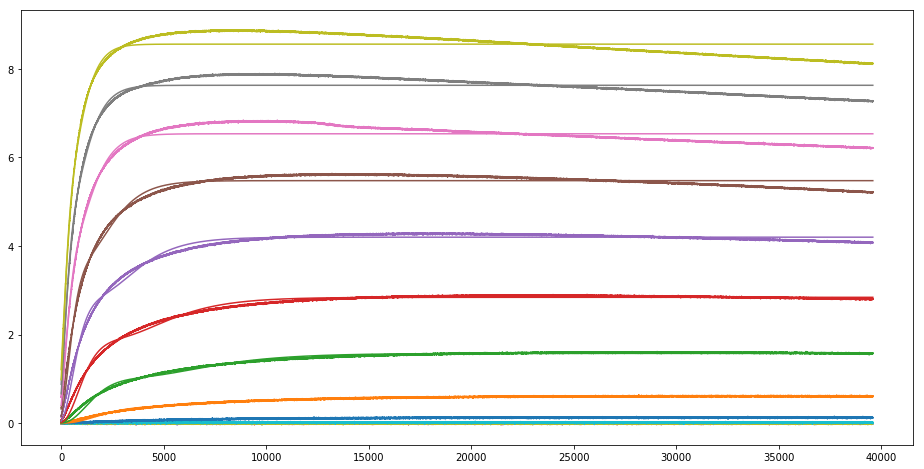

In [6]:
def HH(t, U, p):
    return p[0] * (1 - np.exp(-t/p[1]))**4 * (p[2] - (p[2]-1)*np.exp(-t/p[3])) * U

median_voltages = [np.median(V[Kv21.rec_limits[0]:Kv21.rec_limits[1]]) for V in ana[10].rec.voltage]
t = np.arange(Kv21.rec_limits[1] - Kv21.rec_limits[0]) + Kv21.rec_limits[0] - Kv21.rec_step_t0

plt.figure(figsize=(16,8))
for I,V in zip(ana[10].rec.current, median_voltages):
    plt.plot(I[Kv21.rec_limits[0]:Kv21.rec_limits[1]] - ana[10].params['I_leak'](V))
    
plt.gca().set_prop_cycle(None)

ret0 = None
#fits = []
for I,V in zip(ana[10].rec.current[first_fitted:], median_voltages[first_fitted:]):
    U = V - ana[10].params['E_K']
    p0 = [1.0e-2, 1.0e2, .2, 1.0e3]
    ret1 = scipy.optimize.least_squares(lambda p, x, y: HH(x, U, p) - y,
                                        ret0.x,
                                        args = (t, I[Kv21.rec_limits[0]:Kv21.rec_limits[1]] - ana[10].params['I_leak'](V)),
                                        bounds = ([0.,0.,0.,0.], [np.inf, np.inf, 1., np.inf])
                                       ) if ret0 else None
    ret0 = scipy.optimize.least_squares(lambda p, x, y: HH(x, U, p) - y,
                                        p0,
                                        args = (t, I[Kv21.rec_limits[0]:Kv21.rec_limits[1]] - ana[10].params['I_leak'](V)),
                                        bounds = ([0.,0.,0.,0.], [np.inf, np.inf, 1., np.inf])
                                       )
    
    res = ret1.x if ret1 and ret1.cost < ret0.cost else ret0.x
    plt.plot(HH(t, U, res))
    print res
    #fits.append((res, U))

[2.35469878e-03 2.14872041e+03 9.99839301e-01 1.59167904e+06]
[9.78567465e-03 2.17144636e+03 1.33297192e-04 4.79096126e+08]
[2.20895121e-02 1.58920626e+03 9.78254376e-01 3.31981706e+07]
[3.55322119e-02 1.22641452e+03 1.25596763e-01 3.35301533e+09]
[4.71686766e-02 8.86924753e+02 9.95494845e-01 1.26655247e+08]
[5.59178695e-02 6.67568530e+02 3.04103762e-01 1.45370532e+08]
[6.17309672e-02 5.22157448e+02 6.93697950e-04 8.34057501e+06]
[6.60192166e-02 4.39306013e+02 1.24580487e-03 1.10737550e+07]
[6.84798880e-02 3.69784242e+02 2.44524385e-03 1.17186283e+07]


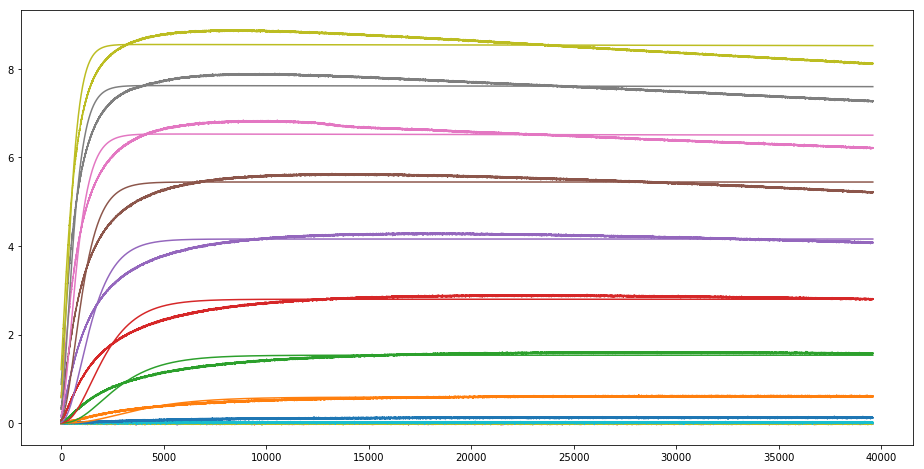

In [7]:
def HH(t, U, p):
    return p[0] * (1 - np.exp(-t/p[1]))**4 * (p[2] - (p[2]-1)*np.exp(-t/p[3])) * U

median_voltages = [np.median(V[Kv21.rec_limits[0]:Kv21.rec_limits[1]]) for V in ana[10].rec.voltage]
t = np.arange(Kv21.rec_limits[1] - Kv21.rec_limits[0]) + Kv21.rec_limits[0] - Kv21.rec_step_t0

plt.figure(figsize=(16,8))
for I,V in zip(ana[10].rec.current, median_voltages):
    plt.plot(I[Kv21.rec_limits[0]:Kv21.rec_limits[1]] - ana[10].params['I_leak'](V))
    
plt.gca().set_prop_cycle(None)

ret0 = None
#fits = []
for I,V in zip(ana[10].rec.current[first_fitted:], median_voltages[first_fitted:]):
    U = V - ana[10].params['E_K']
    p0 = [1.0e-2, 1.0e3, .2, 1.0e5]
    ret1 = ah.bounded_LM_fit(lambda p, x, y: HH(x, U, p) - y,
                                        ret0.x,
                                        args = (t, I[Kv21.rec_limits[0]:Kv21.rec_limits[1]] - ana[10].params['I_leak'](V)),
                                        bounds = ([0.,0.,0.,0.], [np.inf, np.inf, 1., np.inf])
                                       ) if ret0 else None
    ret0 = ah.bounded_LM_fit(lambda p, x, y: HH(x, U, p) - y,
                                        p0,
                                        args = (t, I[Kv21.rec_limits[0]:Kv21.rec_limits[1]] - ana[10].params['I_leak'](V)),
                                        bounds = ([0.,0.,0.,0.], [np.inf, np.inf, 1., np.inf])
                                       )
    
    res = ret1.x if ret1 and ret1.cost < ret0.cost else ret0.x
    plt.plot(HH(t, U, res))
    print res
    #fits.append((res, U))

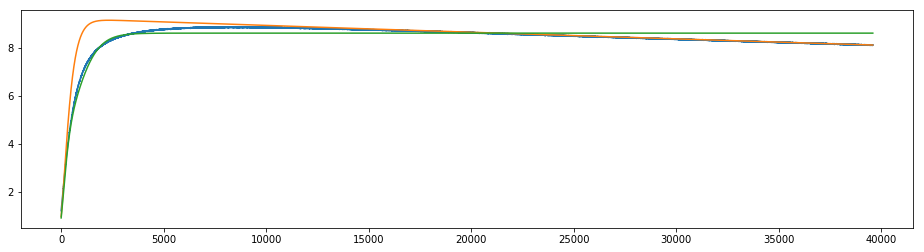

In [8]:
plt.figure(figsize=(16,4))
plt.plot(ana[10].rec.current[-1][Kv21.rec_limits[0]:Kv21.rec_limits[1]] - ana[10].params['I_leak'](median_voltages[-1]))
plt.plot(HH(t, U, [0.074, 3.125e+2, 1e-3, 3.080e+5]))
plt.plot(HH(t, U, [0.69, 5.425e+2, 0.1, 3.080e+2]))

From trying to tune this by hand, it seems that I can either get the inactivation right (orange, first parameters), or I can get the activation curvature (sort of) right with a fast, early inactivation that leaves long-term inactivation unfitted (green).

Neither of these fits look great, exactly... so let's try something else: Perhaps the model is too reductive. Could there be two components to it?
## Two components: One fast and inactivating, and one slow, noninactivating

In [9]:
# Some initial values from several iterations of trying to get a good fast/inact + slow/noninact
fits_ext_p0 = [
    [1.13871334e-03, 1.14416165e+03, 1.33596866e-03, 4.49266985e+03, 1.00000000e+00, 5.33467018e+06],
    [5.63830091e-03, 1.07308645e+03, 4.49616252e-03, 4.56958905e+03, 1.00000000e+00, 1.36231237e+07],
    [1.31806836e-02, 8.18013955e+02, 9.65300974e-03, 3.79804404e+03, 1.00000000e+00, 6.99205317e+06],
    [2.23749646e-02, 6.32921683e+02, 1.43909619e-02, 2.97062426e+03, 3.10986140e-14, 1.14995553e+06],
    [3.22329595e-02, 5.14346559e+02, 1.73674386e-02, 2.42883568e+03, 1.30379837e-15, 4.38244582e+05],
    [4.06874413e-02, 4.27625867e+02, 1.89971803e-02, 1.97436574e+03, 1.43813489e-17, 2.78153224e+05],
    [4.41661886e-02, 3.40250162e+02, 2.19443513e-02, 1.33750010e+03, 2.66922783e-20, 2.17166052e+05],
    [5.17170144e-02, 3.18270155e+02, 1.82299099e-02, 1.29819642e+03, 1.15155176e-15, 2.88816838e+05],
    [5.56846467e-02, 2.92091405e+02, 1.72473115e-02, 1.20603162e+03, 1.80954496e-19, 2.68969067e+05],
]

[1.13871334e-03, 1.14416165e+03, 1.33596866e-03, 4.49266985e+03, 1.00000000e+00, 5.33467018e+06],  8.5549e-01
[5.63830091e-03, 1.07308645e+03, 4.49616252e-03, 4.56958905e+03, 1.00000000e+00, 1.36231237e+07],  1.3632e+00
[1.31806836e-02, 8.18013955e+02, 9.65300974e-03, 3.79804404e+03, 1.00000000e+00, 6.99205317e+06],  4.5580e+00
[2.23749761e-02, 6.32922074e+02, 1.43909538e-02, 2.97062654e+03, 5.74685598e-15, 1.14994949e+06],  1.4135e+01
[3.22329668e-02, 5.14346699e+02, 1.73674329e-02, 2.42883664e+03, 1.26608585e-16, 4.38244332e+05],  2.9677e+01
[4.06874374e-02, 4.27625820e+02, 1.89971835e-02, 1.97436537e+03, 7.22026570e-21, 2.78153243e+05],  4.7077e+01
[4.41661881e-02, 3.40250158e+02, 2.19443517e-02, 1.33750008e+03, 1.85696753e-14, 2.17166050e+05],  2.2839e+01
[5.17170250e-02, 3.18270221e+02, 1.82299001e-02, 1.29819702e+03, 2.68370659e-19, 2.88816848e+05],  4.6164e+01
[5.56846417e-02, 2.92091378e+02, 1.72473161e-02, 1.20603134e+03, 7.34197302e-16, 2.68969061e+05],  4.5673e+01
212.341247

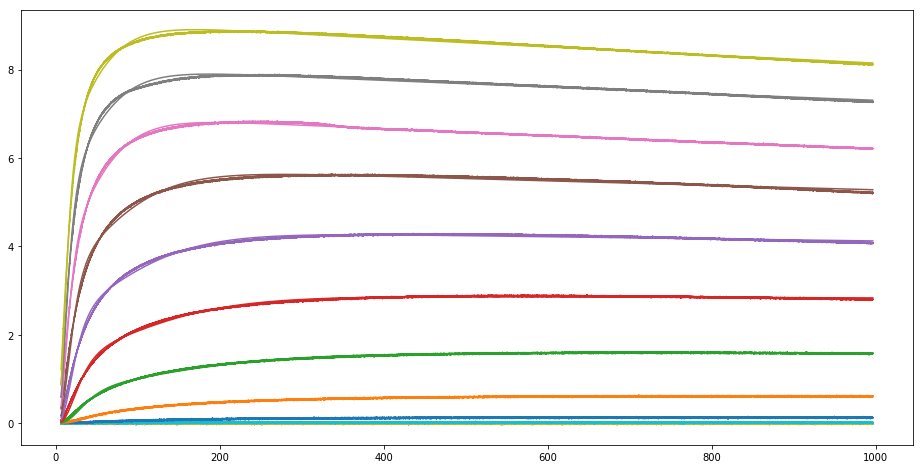

In [10]:
def HH_ext(t, U, p):
    return U * (p[0] * (1 - np.exp(-t/p[1]))**4 * (p[4] - (p[4]-1)*np.exp(-t/p[5])) + p[2] * (1 - np.exp(-t/p[3]))**4)

median_voltages = [np.median(V[Kv21.rec_limits[0]:Kv21.rec_limits[1]]) for V in ana[10].rec.voltage]
t = np.arange(Kv21.rec_limits[1] - Kv21.rec_limits[0]) + Kv21.rec_limits[0] - Kv21.rec_step_t0

plt.figure(figsize=(16,8))
for I,V in zip(ana[10].rec.current, median_voltages):
    plt.plot(t*Kv21.tres, I[Kv21.rec_limits[0]:Kv21.rec_limits[1]] - ana[10].params['I_leak'](V))
plt.gca().set_prop_cycle(None)

ret0 = None
fits_ext = []
cost = 0
for I,V,p0 in zip(ana[10].rec.current[first_fitted:], median_voltages[first_fitted:], fits_ext_p0):
    U = V - ana[10].params['E_K']
    ret1 = scipy.optimize.least_squares(lambda p, x, y: HH_ext(x, U, p) - y,
                                        ret0.x,
                                        args = (t, I[Kv21.rec_limits[0]:Kv21.rec_limits[1]] - ana[10].params['I_leak'](V)),
                                        bounds = ([0.,0.,0.,0.,0.,0.], [np.inf, np.inf, np.inf, np.inf, 1., np.inf])
                                       ) if ret0 else None
    ret0 = scipy.optimize.least_squares(lambda p, x, y: HH_ext(x, U, p) - y,
                                        p0,
                                        args = (t, I[Kv21.rec_limits[0]:Kv21.rec_limits[1]] - ana[10].params['I_leak'](V)),
                                        bounds = ([0.,0.,0.,0.,0.,0.], [np.inf, np.inf, np.inf, np.inf, 1., np.inf])
                                       )
    
    ret = ret1 if ret1 and ret1.cost < ret0.cost else ret0
    plt.plot(t*Kv21.tres, HH_ext(t, U, ret.x))
    print "[%.8e, %.8e, %.8e, %.8e, %.8e, %.8e],  %.4e" % tuple(ret.x.tolist() + [ret.cost])
    fits_ext.append((ret.x, U))
    cost += ret.cost
print cost

Separating the two components gives a very clear picture of what *may* be going on. Compare to the model I've derived from the literature in the last panel:

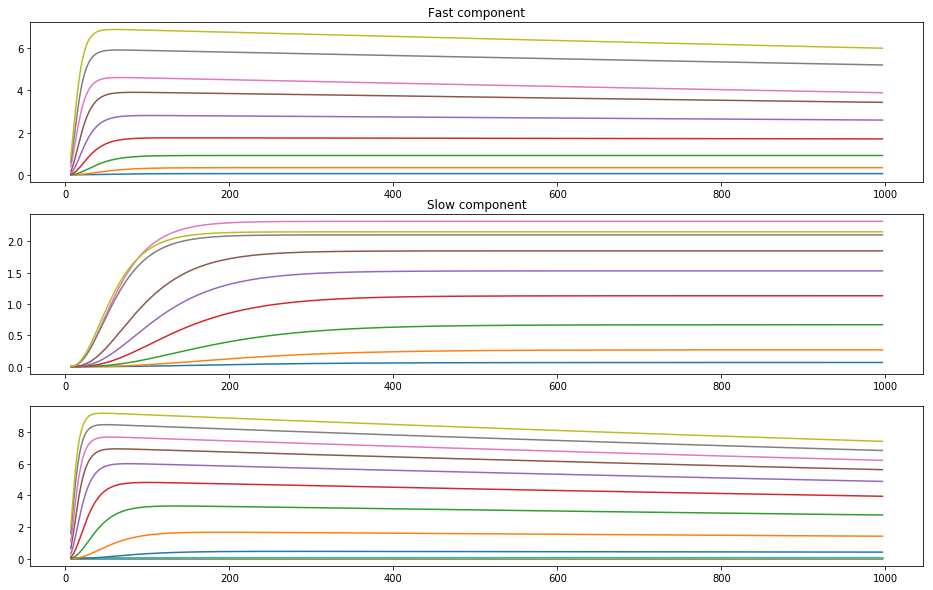

In [11]:
plt.figure(figsize=(16,10))
plt.subplot(3,1,1).set_title('Fast component')
for p, U in fits_ext:
    plt.plot(t*Kv21.tres, U * (p[0] * (1 - np.exp(-t/p[1]))**4 * (p[4] - (p[4]-1)*np.exp(-t/p[5]))))
    
plt.subplot(3,1,2).set_title('Slow component')
for p, U in fits_ext:
    plt.plot(t*Kv21.tres, U * p[2] * (1 - np.exp(-t/p[3]))**4)

plt.subplot(3,1,3)
nmid=-24.
nslope=10.5
taunmin=5.
taunmax=110.
taunoff=36.
taunslope1=18.
taunslope2=-17.
h0=0.2
hmid=-26.
hslope=-6.
tauhmin=400.
tauhmax=3000.
tauhmid=-80.
tauhslope=15.
for V in median_voltages:
    ninf = 1./(1. + np.exp((nmid-V)/nslope))
    taun = taunmin + taunmax/(np.exp((taunoff+V)/taunslope1)+np.exp((taunoff+V)/taunslope2))
    hinf = h0 + (1.-h0)/(1.+np.exp((hmid-V)/hslope))
    tauh = tauhmin + tauhmax/(1.+np.exp((tauhmid-V)/tauhslope))
    plt.plot(t*Kv21.tres, HH(t*Kv21.tres, V-ana[10].params['E_K'], [
        ninf**4 * ana[10].params['g_K'],
        taun,
        hinf,
        tauh
    ]))

If the fit is indeed correct, my model assumption only captures one (though, admittedly, the larger) part of the current, while some 20-25% activate more slowly.
Before jumping to conclusions, though, let's see if a different assumption gives a better fit: Perhaps the slow activating current inactivates, and the fast one doesn't?
## Two components: One fast, noninactivating, and one slow and inactivating

In [12]:
# After some careful coaxing, these initial values seem to put inactivation onto the slow activating current
fits_ext2_p0 = [
    [1.33613536e-03, 4.49226095e+03, 1.13853615e-03, 1.14395441e+03, 1.00000000e+00, 3.47970670e+06],
    [4.49615857e-03, 4.56959245e+03, 5.63830529e-03, 1.07308747e+03, 9.99999980e-01, 2.11693229e+01],
    [1.19399954e-01, 3.82336321e+03, 8.68044098e-03, 5.92015114e+02, 1.19056500e-01, 2.31777606e+03],
    [1.95416312e-01, 2.75369879e+03, 1.39366901e-02, 4.42681314e+02, 1.14351321e-01, 1.66398178e+03],
    [1.75340397e-02, 2.44904406e+03, 3.20906482e-02, 5.13171255e+02, 1.52611159e-14, 2.28494073e+05],
    [1.94353121e-02, 1.99655211e+03, 4.03636661e-02, 4.25236862e+02, 4.07600884e-15, 1.20708674e+05],
    [2.21722749e-02, 1.37325214e+03, 4.41935357e-02, 3.40992445e+02, 1.93516232e-15, 9.56015086e+04],
    [1.89691116e-02, 1.30641099e+03, 5.11923404e-02, 3.15458046e+02, 4.88853959e-15, 9.10870424e+04],
    [1.84291230e-02, 1.20591072e+03, 5.48224918e-02, 2.87845069e+02, 4.75046681e-15, 7.30903502e+04],
]

[1.33617631e-03, 4.49216037e+03, 1.13849262e-03, 1.14390355e+03, 1.00000000e+00, 6.95849109e+06],  8.5549e-01
[4.49615857e-03, 4.56959245e+03, 5.63830529e-03, 1.07308747e+03, 9.99999980e-01, 2.11693229e+01],  1.3632e+00
[1.19399873e-01, 3.82336371e+03, 8.68044399e-03, 5.92015279e+02, 1.19056556e-01, 2.31777672e+03],  1.2687e+00
[1.95416350e-01, 2.75369877e+03, 1.39366886e-02, 4.42681267e+02, 1.14351307e-01, 1.66398175e+03],  8.0357e+00
[1.75340818e-02, 2.44903619e+03, 3.20905925e-02, 5.13170179e+02, 4.42682767e-15, 2.28496192e+05],  2.9997e+01
[1.94352751e-02, 1.99655688e+03, 4.03637125e-02, 4.25237427e+02, 2.00547527e-15, 1.20708108e+05],  4.9796e+01
[2.21722947e-02, 1.37325099e+03, 4.41935134e-02, 3.40992269e+02, 7.57302091e-16, 9.56016593e+04],  2.3995e+01
[1.89691971e-02, 1.30640505e+03, 5.11922435e-02, 3.15457456e+02, 2.70652553e-15, 9.10877711e+04],  5.3230e+01
[1.84291841e-02, 1.20590639e+03, 5.48224215e-02, 2.87844711e+02, 2.64478548e-15, 7.30907889e+04],  5.9092e+01
227.632708

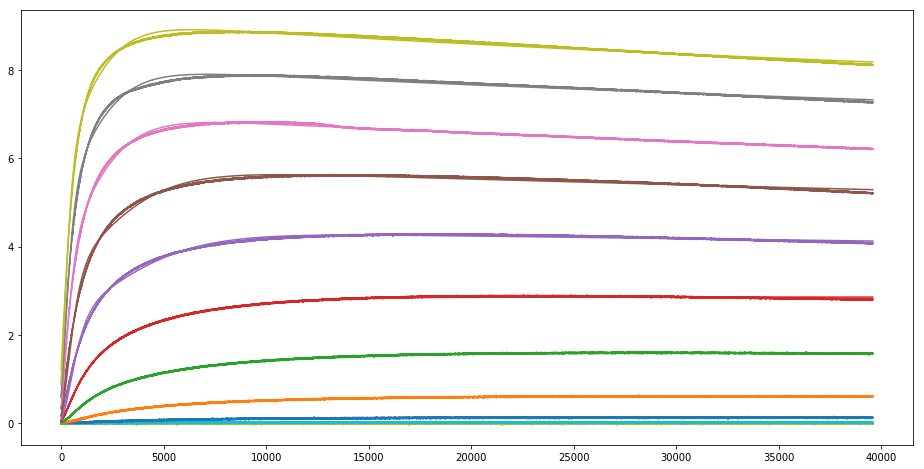

In [13]:
median_voltages = [np.median(V[Kv21.rec_limits[0]:Kv21.rec_limits[1]]) for V in ana[10].rec.voltage]
t = np.arange(Kv21.rec_limits[1] - Kv21.rec_limits[0]) + Kv21.rec_limits[0] - Kv21.rec_step_t0

plt.figure(figsize=(16,8))
for I,V in zip(ana[10].rec.current, median_voltages):
    plt.plot(I[Kv21.rec_limits[0]:Kv21.rec_limits[1]] - ana[10].params['I_leak'](V))
plt.gca().set_prop_cycle(None)

ret0 = None
fits_ext2 = []
cost = 0
for I,V,p0 in zip(ana[10].rec.current[first_fitted:], median_voltages[first_fitted:], fits_ext2_p0):
    U = V - ana[10].params['E_K']
    ret1 = scipy.optimize.least_squares(lambda p, x, y: HH_ext(x, U, p) - y,
                                        ret0.x,
                                        args = (t, I[Kv21.rec_limits[0]:Kv21.rec_limits[1]] - ana[10].params['I_leak'](V)),
                                        bounds = ([0.,0.,0.,0.,0.,0.], [np.inf, np.inf, np.inf, np.inf, 1., np.inf])
                                       ) if ret0 else None
    ret0 = scipy.optimize.least_squares(lambda p, x, y: HH_ext(x, U, p) - y,
                                        p0,
                                        args = (t, I[Kv21.rec_limits[0]:Kv21.rec_limits[1]] - ana[10].params['I_leak'](V)),
                                        bounds = ([0.,0.,0.,0.,0.,0.], [np.inf, np.inf, np.inf, np.inf, 1., np.inf])
                                       )
    
    ret = ret1 if ret1 and ret1.cost < ret0.cost else ret0
    plt.plot(HH_ext(t, U, ret.x))
    print "[%.8e, %.8e, %.8e, %.8e, %.8e, %.8e],  %.4e" % tuple(ret.x.tolist() + [ret.cost])
    fits_ext2.append((ret.x, U))
    cost += ret.cost
print cost

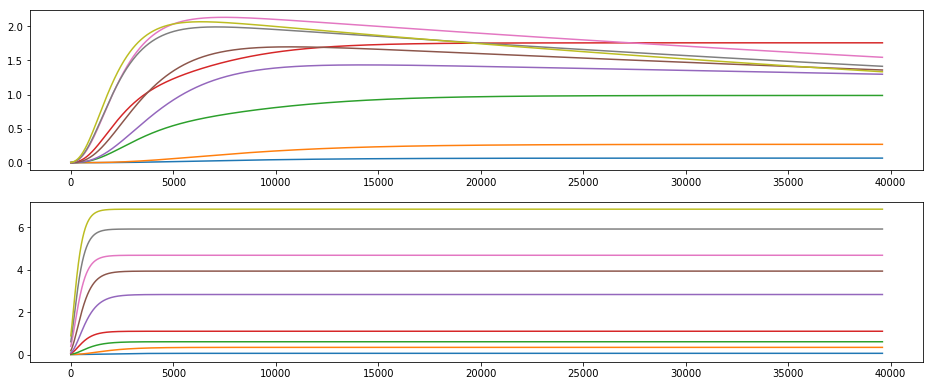

In [14]:
plt.figure(figsize=(16,10))
plt.subplot(3,1,1)
for p, U in fits_ext2:
    plt.plot(U * (p[0] * (1 - np.exp(-t/p[1]))**4 * (p[4] - (p[4]-1)*np.exp(-t/p[5]))))
    
plt.subplot(3,1,2)
for p, U in fits_ext2:
    plt.plot(U * p[2] * (1 - np.exp(-t/p[3]))**4)

I can't see a big difference between the fits at the combined level - both are slightly off on the curvature during the rise, but other than that, both fit well enough with comparable cost. In other words, it doesn't seem to be possible to decide one way or the other, so I'll pick the first one and run with it. If nothing else, it vindicates my literature-derived model. So, let's see if this idea generalises to other recordings!
## Fitting all recordings

0 470.34369865941784
1 93.98145326545377
2 40.85714295586398
3 95.99581641677085
4 904.7472635670998
5 105.16222258638442
6 476.8317797496756
7 427.36288581441136
8 1838.0329634109294
9 220.5033777092668
10 212.3412477774464
11 1074.8224789265867
12 952.5026279109845
13 1692.8034687399786
14 10.988479519832396


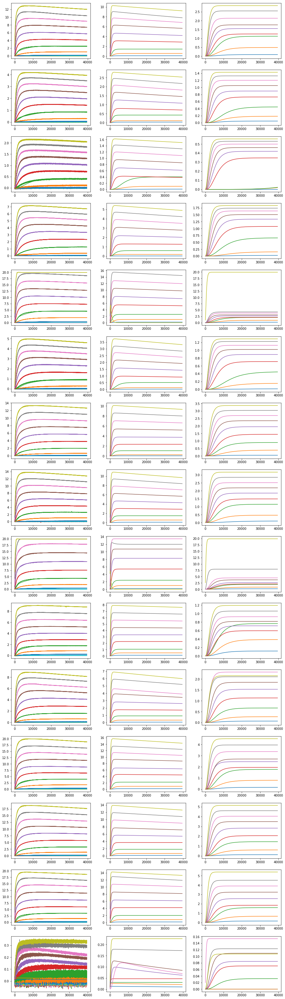

In [15]:
t = np.arange(Kv21.rec_limits[1] - Kv21.rec_limits[0]) + Kv21.rec_limits[0] - Kv21.rec_step_t0
plt.figure(figsize=(16,4*len(ana)))

allfits = [None]*len(ana)

for i,a in enumerate(ana):
    median_voltages = [np.median(V[Kv21.rec_limits[0]:Kv21.rec_limits[1]]) for V in a.rec.voltage]

    plt.subplot(len(ana), 3, 3*i + 1)
    for I,V in zip(a.rec.current, median_voltages):
        plt.plot(I[Kv21.rec_limits[0]:Kv21.rec_limits[1]] - a.params['I_leak'](V))
    plt.gca().set_prop_cycle(None)

    ret0 = None
    f = []
    cost = 0
    for I,V,p0 in zip(a.rec.current[first_fitted:], median_voltages[first_fitted:], fits_ext_p0):
        U = V - a.params['E_K']
        ret1 = scipy.optimize.least_squares(lambda p, x, y: HH_ext(x, U, p) - y,
                                            ret0.x,
                                            args = (t, I[Kv21.rec_limits[0]:Kv21.rec_limits[1]] - a.params['I_leak'](V)),
                                            bounds = ([0.,0.,0.,0.,0.,0.], [np.inf, np.inf, np.inf, np.inf, 1., np.inf])
                                           ) if ret0 else None
        ret0 = scipy.optimize.least_squares(lambda p, x, y: HH_ext(x, U, p) - y,
                                            p0,
                                            args = (t, I[Kv21.rec_limits[0]:Kv21.rec_limits[1]] - a.params['I_leak'](V)),
                                            bounds = ([0.,0.,0.,0.,0.,0.], [np.inf, np.inf, np.inf, np.inf, 1., np.inf])
                                           )

        ret = ret1 if ret1 and ret1.cost < ret0.cost else ret0
        plt.plot(HH_ext(t, U, ret.x))
#         print "[%.8e, %.8e, %.8e, %.8e, %.8e, %.8e],  %.4e" % tuple(ret.x.tolist() + [ret.cost])
        f.append((ret, U))
        cost += ret.cost
    
    print i, cost
    allfits[i] = f
    
    plt.subplot(len(ana), 3, 3*i + 2)
    for p, U in f:
        plt.plot(U * (p.x[0] * (1 - np.exp(-t/p.x[1]))**4 * (p.x[4] - (p.x[4]-1)*np.exp(-t/p.x[5]))))

    plt.subplot(len(ana), 3, 3*i + 3)
    for p, U in f:
        plt.plot(U * p.x[2] * (1 - np.exp(-t/p.x[3]))**4)

Most of this looks pretty reasonable! There are some obvious flukes where the traces are cut off, and the green trace (7th from the top, ~0mV) is often slightly misfit. Let's see if we can squeeze out a better ensemble by tweaking the initial conditions for each one separately:

In [16]:
def fit_single(a, fit_p0, first = first_fitted, last = 19):
    
    t = np.arange(Kv21.rec_limits[1] - Kv21.rec_limits[0]) + Kv21.rec_limits[0] - Kv21.rec_step_t0
    plt.figure(figsize=(16,4))

    median_voltages = [np.median(V[Kv21.rec_limits[0]:Kv21.rec_limits[1]]) for V in a.rec.voltage]

    plt.subplot(1, 3, 1)
    for I,V in zip(a.rec.current, median_voltages):
        plt.plot(I[Kv21.rec_limits[0]:Kv21.rec_limits[1]] - a.params['I_leak'](V))
    plt.gca().set_prop_cycle(None)

    ret0 = None
    f = []
    cost = 0
    for I,V,p0 in zip(a.rec.current[first:last], median_voltages[first:last], fit_p0):
        U = V - a.params['E_K']
        ret1 = scipy.optimize.least_squares(lambda p, x, y: HH_ext(x, U, p) - y,
                                            ret0.x,
                                            args = (t, I[Kv21.rec_limits[0]:Kv21.rec_limits[1]] - a.params['I_leak'](V)),
                                            bounds = ([0.,0.,0.,0.,0.,0.], [np.inf, np.inf, np.inf, np.inf, 1., np.inf])
                                           ) if ret0 else None
        ret0 = scipy.optimize.least_squares(lambda p, x, y: HH_ext(x, U, p) - y,
                                            p0,
                                            args = (t, I[Kv21.rec_limits[0]:Kv21.rec_limits[1]] - a.params['I_leak'](V)),
                                            bounds = ([0.,0.,0.,0.,0.,0.], [np.inf, np.inf, np.inf, np.inf, 1., np.inf])
                                           )

        ret = ret1 if ret1 and ret1.cost < ret0.cost else ret0
        plt.plot(HH_ext(t, U, ret.x))
        print "[%.8e, %.8e, %.8e, %.8e, %.8e, %.8e],  %.4e" % tuple(ret.x.tolist() + [ret.cost])
        f.append((ret, U))
        cost += ret.cost

    plt.subplot(1, 3, 2)
    for p, U in f:
        plt.plot(U * (p.x[0] * (1 - np.exp(-t/p.x[1]))**4 * (p.x[4] - (p.x[4]-1)*np.exp(-t/p.x[5]))))

    plt.subplot(1, 3, 3)
    for p, U in f:
        plt.plot(U * p.x[2] * (1 - np.exp(-t/p.x[3]))**4)
        
    return f, cost

[1.79623223e-03, 1.14416165e+03, 1.92739403e-03, 4.49266985e+03, 1.00000000e+00, 5.33467018e+06],  3.7748e+00
[9.97707407e-03, 1.14416165e+03, 8.97766276e-03, 4.49266985e+03, 1.00000000e+00, 5.33467018e+06],  3.9613e+00
[2.69229964e-02, 8.44663741e+02, 1.27943321e-02, 3.67694476e+03, 9.99999993e-01, 1.39848214e+07],  2.5550e+01
[4.38164387e-02, 6.08834220e+02, 1.73247758e-02, 2.70916068e+03, 1.59767484e-18, 3.98418529e+05],  1.6303e+01
[5.81644721e-02, 4.57159941e+02, 1.91735377e-02, 2.11796841e+03, 1.36037855e-25, 3.39331581e+05],  2.7824e+01
[7.05462745e-02, 3.68770673e+02, 1.95586924e-02, 1.75645424e+03, 4.13580172e-05, 3.36906555e+05],  4.0416e+01
[7.86982671e-02, 2.98733155e+02, 2.14880199e-02, 1.42758256e+03, 5.50271932e-29, 2.98275658e+05],  6.4820e+01
[8.47508793e-02, 2.48969685e+02, 2.36506658e-02, 1.11251517e+03, 1.25830836e-25, 2.52152132e+05],  5.1952e+01
[8.80498072e-02, 2.19620766e+02, 2.42769601e-02, 9.84345986e+02, 1.94009778e-30, 3.46359468e+05],  6.6797e+01
301.396980

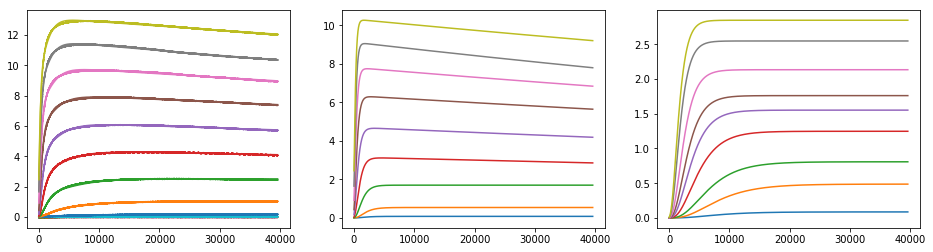

In [17]:
p0 = [
    [1.13871334e-03, 1.14416165e+03, 1.33596866e-03, 4.49266985e+03, 1.00000000e+00, 5.33467018e+06],
    [5.63830091e-03, 1.07308645e+03, 4.49616252e-03, 4.56958905e+03, 1.00000000e+00, 1.36231237e+07],
    [1.26052377e-02, 7.18013952e+02, 9.77359960e-03, 3.79804402e+03, 1.00000000e+00, 6.99205317e+06],
    [2.23749646e-02, 6.32921683e+02, 1.43909619e-02, 2.97062426e+03, 3.10986140e-14, 1.14995553e+06],
    [3.22329595e-02, 5.14346559e+02, 1.73674386e-02, 2.42883568e+03, 1.30379837e-15, 4.38244582e+05],
    [4.06874413e-02, 4.27625867e+02, 1.89971803e-02, 1.97436574e+03, 1.43813489e-17, 2.78153224e+05],
    [4.41661886e-02, 3.40250162e+02, 2.19443513e-02, 1.33750010e+03, 2.66922783e-20, 2.17166052e+05],
    [5.17170144e-02, 3.18270155e+02, 1.82299099e-02, 1.29819642e+03, 1.15155176e-15, 2.88816838e+05],
    [5.56846467e-02, 2.92091405e+02, 1.72473115e-02, 1.20603162e+03, 1.80954496e-19, 2.68969067e+05],
]
allfits[0], cost = fit_single(ana[0], p0)
print cost

[6.67385729e-04, 1.14416165e+03, 8.51462449e-04, 4.49266985e+03, 9.99997978e-01, 5.33467018e+06],  1.9422e+01
[1.71546079e-03, 8.15234151e+02, 2.80729089e-03, 5.38874914e+03, 1.00000000e+00, 1.15420888e+07],  1.7865e+00
[4.85315477e-03, 9.37042433e+02, 6.39226883e-03, 3.91235498e+03, 9.99999999e-01, 1.05324979e+08],  3.1948e+00
[9.54706267e-03, 7.99782245e+02, 8.58838514e-03, 2.96143578e+03, 1.58949252e-22, 2.89687439e+05],  5.3611e+00
[1.36149187e-02, 6.29361081e+02, 9.47711970e-03, 2.20549086e+03, 1.93473873e-28, 2.30451822e+05],  7.0053e+00
[1.64631932e-02, 4.96960572e+02, 1.00827744e-02, 1.65552169e+03, 9.32783647e-24, 2.37827654e+05],  7.9050e+00
[1.85105757e-02, 4.05056623e+02, 1.05349777e-02, 1.30692077e+03, 2.48656511e-23, 2.60646521e+05],  8.7526e+00
[2.00411879e-02, 3.42432794e+02, 1.07110650e-02, 1.08360189e+03, 3.00464167e-24, 3.02121807e+05],  9.5468e+00
[2.11153276e-02, 2.96022407e+02, 1.06995056e-02, 9.38400288e+02, 7.05780038e-18, 3.68535401e+05],  1.0548e+01
73.5223487

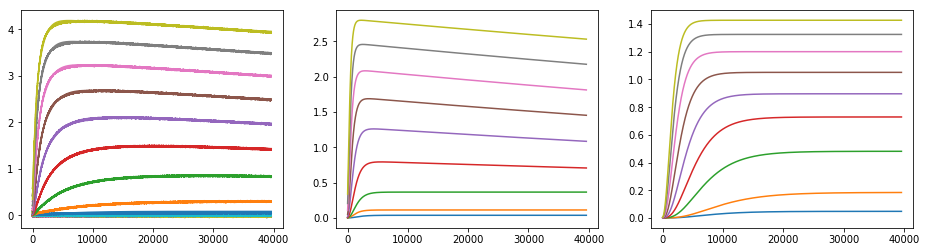

In [18]:
p0 = [
    [1.13871334e-03, 1.14416165e+03, 1.33596866e-03, 4.49266985e+03, 1.00000000e+00, 5.33467018e+06],
    [5.63830091e-03, 1.07308645e+03, 4.49616252e-03, 4.56958905e+03, 1.00000000e+00, 1.36231237e+07],
    [1.26052377e-02, 7.18013952e+02, 9.77359960e-03, 3.79804402e+03, 1.00000000e+00, 6.99205317e+06],
    [2.23749646e-02, 6.32921683e+02, 1.43909619e-02, 2.97062426e+03, 3.10986140e-14, 1.14995553e+06],
    [3.22329595e-02, 5.14346559e+02, 1.73674386e-02, 2.42883568e+03, 1.30379837e-15, 4.38244582e+05],
    [4.06874413e-02, 4.27625867e+02, 1.89971803e-02, 1.97436574e+03, 1.43813489e-17, 2.78153224e+05],
    [4.41661886e-02, 3.40250162e+02, 2.19443513e-02, 1.33750010e+03, 2.66922783e-20, 2.17166052e+05],
    [5.17170144e-02, 3.18270155e+02, 1.82299099e-02, 1.29819642e+03, 1.15155176e-15, 2.88816838e+05],
    [5.56846467e-02, 2.92091405e+02, 1.72473115e-02, 1.20603162e+03, 1.80954496e-19, 2.68969067e+05],
]
allfits[1], cost = fit_single(ana[1], p0)
print cost

[2.02400395e-04, 8.12549448e+03, 1.11693705e-04, 8.27740740e+07, 6.12951851e-02, 9.94577573e+05],  1.4154e+00
[8.51626136e-04, 2.29983365e+03, 1.09298845e-03, 7.48194453e+03, 1.00000000e+00, 3.17241126e+06],  1.4257e+00
[2.69442577e-03, 1.54214748e+03, 3.21077710e-03, 4.85178493e+03, 2.41293884e-04, 4.37674485e+06],  1.4798e+00
[5.57879020e-03, 1.12021710e+03, 4.44167918e-03, 3.63229194e+03, 2.16089526e-14, 3.00986842e+05],  1.6405e+00
[8.02162984e-03, 8.21754554e+02, 4.76806400e-03, 2.66650473e+03, 7.63197820e-23, 2.83043618e+05],  1.9282e+00
[9.92829727e-03, 6.36108678e+02, 4.71390286e-03, 2.03266543e+03, 9.89973983e-21, 3.09013328e+05],  2.2541e+00
[1.12937953e-02, 5.08443185e+02, 4.63826454e-03, 1.59324869e+03, 8.17898795e-27, 3.49906467e+05],  2.4800e+00
[1.22367442e-02, 4.21983763e+02, 4.51437098e-03, 1.31150701e+03, 2.01856678e-27, 4.00645730e+05],  2.6563e+00
[1.28131367e-02, 3.56455772e+02, 4.37205988e-03, 1.11283922e+03, 2.44217321e-17, 4.82487392e+05],  2.9278e+00
18.2079220

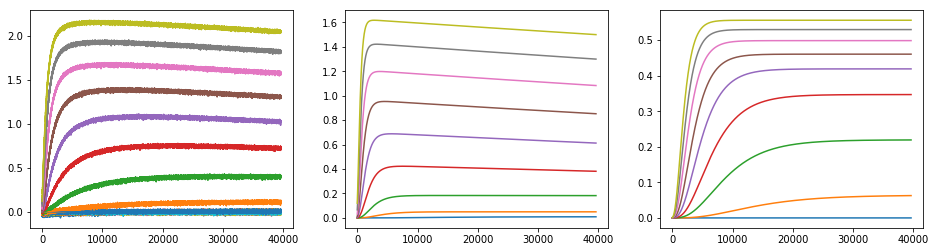

In [19]:
p0 = [
    [1.13871334e-03, 1.14416165e+03, 1.33596866e-03, 4.49266985e+03, 1.00000000e+00, 5.33467018e+06],
    [2.69442577e-03, 1.54214748e+03, 3.21077710e-03, 4.85178493e+03, 2.41293884e-04, 4.37674485e+06],
    [1.26052377e-02, 7.18013952e+02, 9.77359960e-03, 3.79804402e+03, 1.00000000e+00, 6.99205317e+06],
    [2.23749646e-02, 6.32921683e+02, 1.43909619e-02, 2.97062426e+03, 3.10986140e-14, 1.14995553e+06],
    [3.22329595e-02, 5.14346559e+02, 1.73674386e-02, 2.42883568e+03, 1.30379837e-15, 4.38244582e+05],
    [4.06874413e-02, 4.27625867e+02, 1.89971803e-02, 1.97436574e+03, 1.43813489e-17, 2.78153224e+05],
    [4.41661886e-02, 3.40250162e+02, 2.19443513e-02, 1.33750010e+03, 2.66922783e-20, 2.17166052e+05],
    [5.17170144e-02, 3.18270155e+02, 1.82299099e-02, 1.29819642e+03, 1.15155176e-15, 2.88816838e+05],
    [5.56846467e-02, 2.92091405e+02, 1.72473115e-02, 1.20603162e+03, 1.80954496e-19, 2.68969067e+05],
]
allfits[2], cost = fit_single(ana[2], p0)
print cost

[2.00052585e-04, 9.54477140e+02, 4.63014308e-04, 7.26229038e+03, 1.00000000e+00, 6.09097575e+07],  1.2065e+00
[2.21577115e-03, 2.05383352e+03, 3.56472318e-03, 7.72970297e+03, 9.99999997e-01, 8.79683595e+01],  1.4737e+00
[8.14079996e-03, 1.59127045e+03, 9.15794937e-03, 5.49466494e+03, 1.00000000e+00, 8.59561280e+06],  2.5229e+00
[1.61149800e-02, 1.11507628e+03, 1.32519442e-02, 3.82324435e+03, 4.69904212e-14, 1.20595809e+06],  4.7204e+00
[2.45788618e-02, 8.40893678e+02, 1.48079640e-02, 2.95519892e+03, 2.38169274e-18, 3.95542094e+05],  8.2507e+00
[3.13151236e-02, 6.57235965e+02, 1.50786945e-02, 2.29572162e+03, 2.36753579e-23, 3.31100994e+05],  1.1518e+01
[3.63131247e-02, 5.31466972e+02, 1.49917924e-02, 1.81155700e+03, 9.84762878e-26, 3.18535619e+05],  1.3261e+01
[4.00461866e-02, 4.44541009e+02, 1.46494826e-02, 1.47749926e+03, 1.54108227e-17, 3.32309762e+05],  1.4012e+01
[4.26024442e-02, 3.81242634e+02, 1.42975430e-02, 1.24586479e+03, 3.73501323e-26, 3.57698074e+05],  1.4160e+01
71.1253332

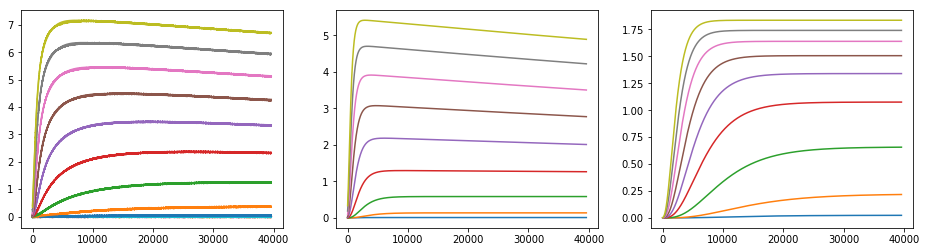

In [20]:
p0 = [
    [1.13871334e-03, 1.14416165e+03, 1.33596866e-03, 4.49266985e+03, 1.00000000e+00, 5.33467018e+06],
    [2.69442577e-03, 1.54214748e+03, 3.21077710e-03, 4.85178493e+03, 2.41293884e-04, 4.37674485e+06],
    [1.26052377e-02, 7.18013952e+02, 9.77359960e-03, 3.79804402e+03, 1.00000000e+00, 6.99205317e+06],
    [2.23749646e-02, 6.32921683e+02, 1.43909619e-02, 2.97062426e+03, 3.10986140e-14, 1.14995553e+06],
    [3.22329595e-02, 5.14346559e+02, 1.73674386e-02, 2.42883568e+03, 1.30379837e-15, 4.38244582e+05],
    [4.06874413e-02, 4.27625867e+02, 1.89971803e-02, 1.97436574e+03, 1.43813489e-17, 2.78153224e+05],
    [4.41661886e-02, 3.40250162e+02, 2.19443513e-02, 1.33750010e+03, 2.66922783e-20, 2.17166052e+05],
    [5.17170144e-02, 3.18270155e+02, 1.82299099e-02, 1.29819642e+03, 1.15155176e-15, 2.88816838e+05],
    [5.56846467e-02, 2.92091405e+02, 1.72473115e-02, 1.20603162e+03, 1.80954496e-19, 2.68969067e+05],
]
allfits[3], cost = fit_single(ana[3], p0)
print cost

[2.79120946e-03, 1.14416165e+03, 2.82846744e-03, 4.49266985e+03, 1.00000000e+00, 5.33467018e+06],  1.8967e+01
[1.46748486e-02, 1.35970101e+03, 1.14592987e-02, 4.62041760e+03, 1.00000000e+00, 1.36238935e+08],  3.4998e+00
[3.57082321e-02, 8.79882332e+02, 1.89674537e-02, 3.68413493e+03, 9.99999988e-01, 1.39848214e+07],  8.3230e+01
[6.03128664e-02, 6.70177343e+02, 2.31730105e-02, 2.55168367e+03, 1.30752923e-19, 6.36685007e+05],  2.2869e+01
[8.14627514e-02, 5.07313534e+02, 2.68684547e-02, 1.90556877e+03, 3.14809286e-22, 3.99001575e+05],  3.6570e+01
[9.83362735e-02, 4.02308670e+02, 2.86235172e-02, 1.46970679e+03, 8.37587762e-28, 4.71602107e+05],  4.0895e+01
[1.11166888e-01, 3.32085948e+02, 3.26698491e-02, 1.34140933e+03, 4.55601012e-26, 5.02118409e+05],  9.0756e+01
[1.24368099e-01, 2.85154556e+02, 3.39074223e-02, 1.19298732e+03, 2.03149623e-30, 5.40745171e+05],  1.4181e+02
438.5961051995089


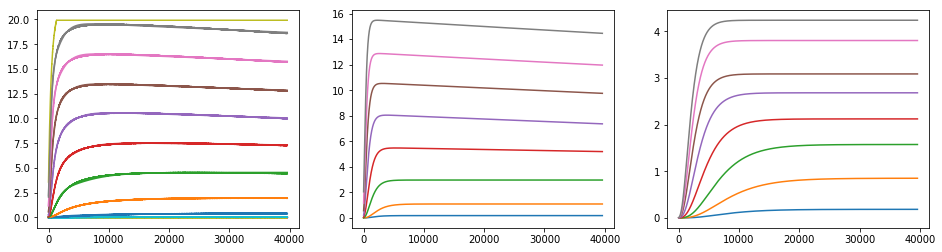

In [21]:
p0 = [
    [1.13871334e-03, 1.14416165e+03, 1.33596866e-03, 4.49266985e+03, 1.00000000e+00, 5.33467018e+06],
    [2.69442577e-03, 1.54214748e+03, 3.21077710e-03, 4.85178493e+03, 2.41293884e-04, 4.37674485e+06],
    [1.26052377e-02, 7.18013952e+02, 9.77359960e-03, 3.79804402e+03, 1.00000000e+00, 6.99205317e+06],
    [2.23749646e-02, 6.32921683e+02, 1.43909619e-02, 2.97062426e+03, 3.10986140e-14, 1.14995553e+06],
    [3.22329595e-02, 5.14346559e+02, 1.73674386e-02, 2.42883568e+03, 1.30379837e-15, 4.38244582e+05],
    [4.06874413e-02, 4.27625867e+02, 1.89971803e-02, 1.97436574e+03, 1.43813489e-17, 2.78153224e+05],
    [4.41661886e-02, 3.40250162e+02, 2.19443513e-02, 1.33750010e+03, 2.66922783e-20, 2.17166052e+05],
    [5.17170144e-02, 3.18270155e+02, 1.82299099e-02, 1.29819642e+03, 1.15155176e-15, 2.88816838e+05],
    [5.56846467e-02, 2.92091405e+02, 1.72473115e-02, 1.20603162e+03, 1.80954496e-19, 2.68969067e+05],
]
allfits[4], cost = fit_single(ana[4], p0, last=-1)
print cost

[3.26186566e-04, 3.96161211e+03, 2.88378364e-04, 1.16777885e+04, 9.98128761e-01, 6.75063576e+07],  1.5838e+00
[2.02658664e-03, 2.14327736e+03, 2.49273515e-03, 6.87149314e+03, 1.00000000e+00, 1.25468441e+08],  1.6882e+00
[6.29949195e-03, 1.43053615e+03, 6.19921239e-03, 4.67974482e+03, 1.00000000e+00, 3.96683398e+06],  1.9446e+00
[1.22848466e-02, 1.02565951e+03, 8.73822438e-03, 3.53230883e+03, 3.85831347e-12, 4.14651039e+05],  2.8611e+00
[1.77060763e-02, 7.64024634e+02, 9.80686064e-03, 2.66296191e+03, 1.60153608e-20, 3.07722947e+05],  4.2382e+00
[2.20064944e-02, 5.96345230e+02, 1.01568888e-02, 2.03353503e+03, 1.09773719e-19, 2.82866242e+05],  5.4054e+00
[2.51872279e-02, 4.85211753e+02, 1.02515800e-02, 1.60253000e+03, 4.73277127e-25, 2.67489536e+05],  6.0980e+00
[2.71822450e-02, 4.10233347e+02, 1.02531854e-02, 1.31347538e+03, 1.51788247e-20, 2.92965089e+05],  5.9531e+00
[2.92891012e-02, 3.55061609e+02, 9.99282710e-03, 1.14650898e+03, 3.40309052e-27, 3.00127498e+05],  6.8333e+00
36.6056998

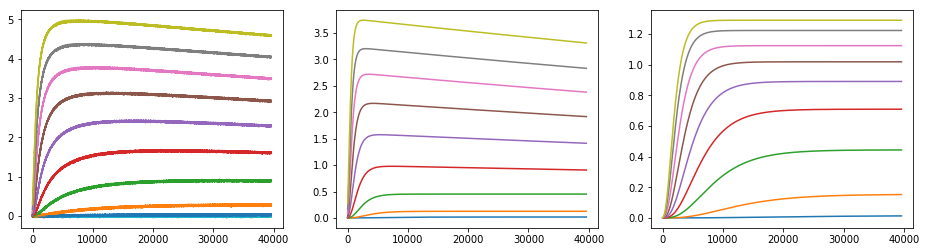

In [22]:
p0 = [
    [1.13871334e-03, 1.14416165e+03, 1.33596866e-03, 4.49266985e+03, 1.00000000e+00, 5.33467018e+06],
    [2.69442577e-03, 1.54214748e+03, 3.21077710e-03, 4.85178493e+03, 2.41293884e-04, 4.37674485e+06],
    [1.26052377e-02, 7.18013952e+02, 9.77359960e-03, 3.79804402e+03, 1.00000000e+00, 6.99205317e+06],
    [2.23749646e-02, 6.32921683e+02, 1.43909619e-02, 2.97062426e+03, 3.10986140e-14, 1.14995553e+06],
    [3.22329595e-02, 5.14346559e+02, 1.73674386e-02, 2.42883568e+03, 1.30379837e-15, 4.38244582e+05],
    [4.06874413e-02, 4.27625867e+02, 1.89971803e-02, 1.97436574e+03, 1.43813489e-17, 2.78153224e+05],
    [4.41661886e-02, 3.40250162e+02, 2.19443513e-02, 1.33750010e+03, 2.66922783e-20, 2.17166052e+05],
    [5.17170144e-02, 3.18270155e+02, 1.82299099e-02, 1.29819642e+03, 1.15155176e-15, 2.88816838e+05],
    [5.56846467e-02, 2.92091405e+02, 1.72473115e-02, 1.20603162e+03, 1.80954496e-19, 2.68969067e+05],
]
allfits[5], cost = fit_single(ana[5], p0)
print cost

[8.28678255e-04, 1.14416165e+03, 1.01347184e-03, 4.49266985e+03, 9.99998672e-01, 5.33467018e+06],  3.8756e+00
[4.34152589e-03, 1.24768534e+03, 6.60008560e-03, 5.82531905e+03, 1.00000000e+00, 1.85225779e+08],  3.3526e+00
[1.53103996e-02, 1.24768534e+03, 1.51861268e-02, 5.82531903e+03, 1.00000000e+00, 1.85225779e+08],  1.2461e+02
[3.09484963e-02, 8.89271048e+02, 1.90695622e-02, 3.82095398e+03, 1.00000000e+00, 8.09568696e+08],  1.9284e+01
[4.51177052e-02, 6.65414192e+02, 2.31082319e-02, 3.00444034e+03, 1.06772167e-10, 2.08415813e+06],  3.7487e+01
[5.82540548e-02, 5.25992393e+02, 2.51892827e-02, 2.49167609e+03, 1.15632496e-17, 8.58456955e+05],  6.6428e+01
[6.93486547e-02, 4.28395978e+02, 2.63766836e-02, 2.02581906e+03, 1.85027669e-26, 5.70232963e+05],  9.0600e+01
[7.77541213e-02, 3.60445794e+02, 2.72583675e-02, 1.66869228e+03, 1.30304301e-28, 5.05365961e+05],  1.1142e+02
[8.43756877e-02, 3.11136190e+02, 2.79372743e-02, 1.41039381e+03, 3.16327789e-32, 4.60462573e+05],  1.2970e+02
586.760454

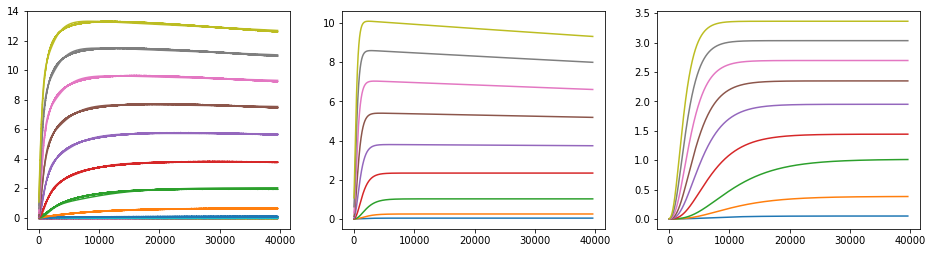

In [23]:
p0 = [
    [1.13871334e-03, 1.14416165e+03, 1.33596866e-03, 4.49266985e+03, 1.00000000e+00, 5.33467018e+06],
    [2.69442577e-03, 1.54214748e+03, 3.21077710e-03, 4.85178493e+03, 2.41293884e-04, 4.37674485e+06],
    [3.09484278e-02, 8.89268660e+02, 1.90696268e-02, 3.82094350e+03, 1.00000000e+00, 2.02392174e+08],
    [2.23749646e-02, 6.32921683e+02, 1.43909619e-02, 2.97062426e+03, 3.10986140e-14, 1.14995553e+06],
    [3.22329595e-02, 5.14346559e+02, 1.73674386e-02, 2.42883568e+03, 1.30379837e-15, 4.38244582e+05],
    [4.06874413e-02, 4.27625867e+02, 1.89971803e-02, 1.97436574e+03, 1.43813489e-17, 2.78153224e+05],
    [4.41661886e-02, 3.40250162e+02, 2.19443513e-02, 1.33750010e+03, 2.66922783e-20, 2.17166052e+05],
    [5.17170144e-02, 3.18270155e+02, 1.82299099e-02, 1.29819642e+03, 1.15155176e-15, 2.88816838e+05],
    [5.56846467e-02, 2.92091405e+02, 1.72473115e-02, 1.20603162e+03, 1.80954496e-19, 2.68969067e+05],
]
allfits[6], cost = fit_single(ana[6], p0)
print cost

[1.54878686e-03, 1.99960374e+03, 1.74052474e-03, 7.31924356e+03, 1.00000000e+00, 7.28887783e+06],  3.9596e+00
[8.52473123e-03, 1.53963916e+03, 7.30361950e-03, 5.32187402e+03, 9.99999998e-01, 2.10083753e+08],  4.8705e+00
[2.08520782e-02, 1.03399539e+03, 1.34267321e-02, 3.72547679e+03, 8.36776775e-06, 9.56499592e+06],  7.7580e+00
[3.56833082e-02, 7.42143804e+02, 1.72906663e-02, 2.93036406e+03, 4.95428467e-18, 5.83804829e+05],  1.5668e+01
[4.91356342e-02, 5.57373698e+02, 1.94049381e-02, 2.33407697e+03, 8.02948906e-25, 4.12414397e+05],  3.0888e+01
[6.01897627e-02, 4.36764622e+02, 2.08129797e-02, 1.86995439e+03, 1.43201704e-27, 3.56772861e+05],  4.8513e+01
[6.91013798e-02, 3.55068871e+02, 2.19249187e-02, 1.52950328e+03, 4.07423845e-28, 3.37076068e+05],  6.7305e+01
[7.60761641e-02, 2.96780414e+02, 2.29509569e-02, 1.27055433e+03, 2.34834756e-31, 3.27240039e+05],  8.2423e+01
[8.16443173e-02, 2.54287007e+02, 2.37421544e-02, 1.07521775e+03, 3.81462896e-31, 3.24512977e+05],  9.1974e+01
353.358859

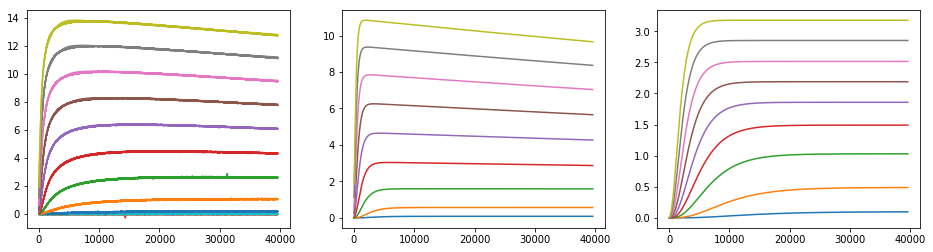

In [24]:
p0 = [
    [1.13871334e-03, 1.14416165e+03, 1.33596866e-03, 4.49266985e+03, 1.00000000e+00, 5.33467018e+06],
    [2.69442577e-03, 1.54214748e+03, 3.21077710e-03, 4.85178493e+03, 2.41293884e-04, 4.37674485e+06],
    [1.26052377e-02, 7.18013952e+02, 9.77359960e-03, 3.79804402e+03, 1.00000000e+00, 6.99205317e+06],
    [2.23749646e-02, 6.32921683e+02, 1.43909619e-02, 2.97062426e+03, 3.10986140e-14, 1.14995553e+06],
    [3.22329595e-02, 5.14346559e+02, 1.73674386e-02, 2.42883568e+03, 1.30379837e-15, 4.38244582e+05],
    [4.06874413e-02, 4.27625867e+02, 1.89971803e-02, 1.97436574e+03, 1.43813489e-17, 2.78153224e+05],
    [4.41661886e-02, 3.40250162e+02, 2.19443513e-02, 1.33750010e+03, 2.66922783e-20, 2.17166052e+05],
    [5.17170144e-02, 3.18270155e+02, 1.82299099e-02, 1.29819642e+03, 1.15155176e-15, 2.88816838e+05],
    [5.56846467e-02, 2.92091405e+02, 1.72473115e-02, 1.20603162e+03, 1.80954496e-19, 2.68969067e+05],
]
allfits[7], cost = fit_single(ana[7], p0)
print cost

[3.66364611e-03, 1.14416165e+03, 3.58102169e-03, 4.49266985e+03, 1.00000000e+00, 5.33467018e+06],  1.6383e+01
[1.61994889e-02, 1.14039465e+03, 1.14466586e-02, 4.10149806e+03, 1.00000000e+00, 2.35984789e+08],  1.9948e+00
[3.84987736e-02, 7.92156679e+02, 1.86361543e-02, 3.20058138e+03, 1.00000000e+00, 4.08234214e+07],  2.3350e+01
[6.50156396e-02, 5.92156681e+02, 2.54392299e-02, 3.20058139e+03, 1.00000000e+00, 4.08234214e+07],  1.0834e+02
[9.03446147e-02, 4.54223619e+02, 2.92518217e-02, 2.79959218e+03, 1.00000000e+00, 2.88946648e+07],  2.6060e+02
[1.07402552e-01, 3.47444598e+02, 3.72028220e-02, 2.21415900e+03, 1.00000000e+00, 2.15568752e+07],  3.2233e+02
[1.24420568e-01, 2.80951286e+02, 4.15477235e-02, 1.76385779e+03, 9.99999996e-01, 2.41962459e+07],  5.1110e+02
1244.10313206357


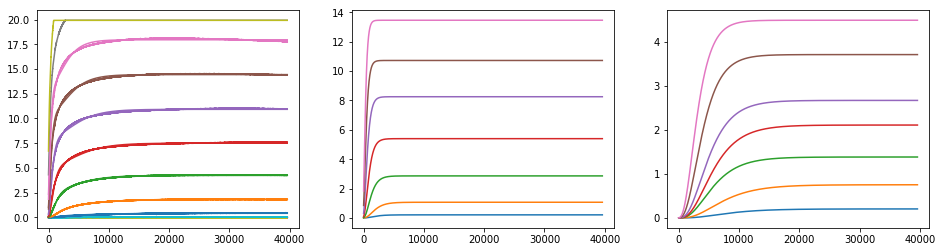

In [25]:
p0 = [
    [1.13871334e-03, 1.14416165e+03, 1.33596866e-03, 4.49266985e+03, 1.00000000e+00, 5.33467018e+06],
    [2.69442577e-03, 1.54214748e+03, 3.21077710e-03, 4.85178493e+03, 2.41293884e-04, 4.37674485e+06],
    [3.50156396e-02, 7.92156681e+02, 1.54392299e-02, 3.20058139e+03, 1.00000000e+00, 4.08234214e+07],    
    [2.23749646e-02, 6.32921683e+02, 1.43909619e-02, 2.97062426e+03, 3.10986140e-14, 1.14995553e+06],
    [3.22329595e-02, 5.14346559e+02, 1.73674386e-02, 2.42883568e+03, 1.30379837e-15, 4.38244582e+05],
    [4.06874413e-02, 4.27625867e+02, 1.89971803e-02, 1.97436574e+03, 1.43813489e-17, 2.78153224e+05],
    [4.41661886e-02, 3.40250162e+02, 2.19443513e-02, 1.33750010e+03, 2.66922783e-20, 2.17166052e+05],
    [5.17170144e-02, 3.18270155e+02, 1.82299099e-02, 1.29819642e+03, 1.15155176e-15, 2.88816838e+05],
    [5.56846467e-02, 2.92091405e+02, 1.72473115e-02, 1.20603162e+03, 1.80954496e-19, 2.68969067e+05],
]
allfits[8], cost = fit_single(ana[8], p0, last=-2)
print cost

[1.87915585e-03, 1.14416165e+03, 1.99496827e-03, 4.49266985e+03, 1.00000000e+00, 5.33467018e+06],  2.6720e+00
[8.39217030e-03, 1.26085226e+03, 4.34335260e-03, 4.95480694e+03, 9.99999999e-01, 1.11492697e+09],  1.9074e+00
[1.71508316e-02, 8.67933417e+02, 5.94208563e-03, 3.81055975e+03, 1.00000000e+00, 1.40076625e+07],  3.0309e+00
[2.61679969e-02, 6.18753246e+02, 6.89503232e-03, 2.99586212e+03, 1.00000000e+00, 1.73295334e+06],  4.4164e+00
[3.46168183e-02, 4.67844309e+02, 7.43999005e-03, 2.40923252e+03, 1.89778941e-06, 4.78441227e+07],  7.6778e+00
[4.24864243e-02, 3.75652898e+02, 7.76781294e-03, 2.11035994e+03, 1.03524050e-16, 2.47134806e+06],  1.4139e+01
[4.93077375e-02, 3.11551255e+02, 8.11374078e-03, 1.85615637e+03, 3.65382064e-17, 1.44242738e+06],  2.2054e+01
[5.49719864e-02, 2.65148998e+02, 8.57385205e-03, 1.60468896e+03, 2.03903190e-15, 1.15173047e+06],  2.8549e+01
[5.98244486e-02, 2.31365646e+02, 8.98909991e-03, 1.44123253e+03, 1.49277922e-29, 9.52018641e+05],  3.5542e+01
119.988655

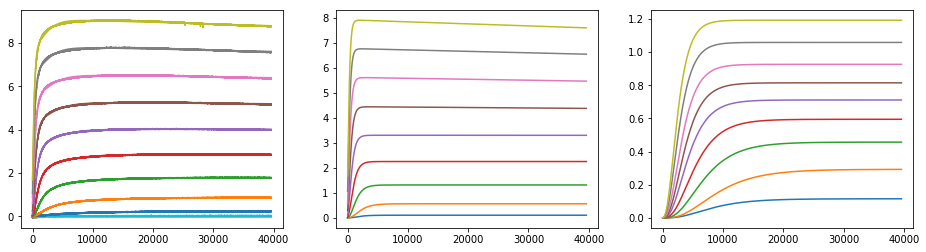

In [26]:
p0 = [
    [1.13871334e-03, 1.14416165e+03, 1.33596866e-03, 4.49266985e+03, 1.00000000e+00, 5.33467018e+06],
    [2.69442577e-03, 1.54214748e+03, 3.21077710e-03, 4.85178493e+03, 2.41293884e-04, 4.37674485e+06],
    [1.26052377e-02, 7.18013952e+02, 9.77359960e-03, 3.79804402e+03, 1.00000000e+00, 6.99205317e+06],
    [2.23749646e-02, 6.32921683e+02, 1.43909619e-02, 2.97062426e+03, 3.10986140e-14, 1.14995553e+06],
    [3.22329595e-02, 5.14346559e+02, 1.73674386e-02, 2.42883568e+03, 1.30379837e-15, 4.38244582e+05],
    [4.06874413e-02, 4.27625867e+02, 1.89971803e-02, 1.97436574e+03, 1.43813489e-17, 2.78153224e+05],
    [4.41661886e-02, 3.40250162e+02, 2.19443513e-02, 1.33750010e+03, 2.66922783e-20, 2.17166052e+05],
    [5.17170144e-02, 3.18270155e+02, 1.82299099e-02, 1.29819642e+03, 1.15155176e-15, 2.88816838e+05],
    [5.56846467e-02, 2.92091405e+02, 1.72473115e-02, 1.20603162e+03, 1.80954496e-19, 2.68969067e+05],
]
allfits[9], cost = fit_single(ana[9], p0)
print cost

[1.13871334e-03, 1.14416165e+03, 1.33596866e-03, 4.49266985e+03, 1.00000000e+00, 5.33467018e+06],  8.5549e-01
[5.63823658e-03, 1.07307147e+03, 4.49622198e-03, 4.56953912e+03, 1.00000000e+00, 2.23185738e+09],  1.3632e+00
[1.31047373e-02, 8.11208826e+02, 9.72528773e-03, 3.77658128e+03, 1.00000000e+00, 5.23146961e+10],  4.5647e+00
[2.23749761e-02, 6.32922074e+02, 1.43909538e-02, 2.97062654e+03, 5.74685598e-15, 1.14994949e+06],  1.4135e+01
[3.22329668e-02, 5.14346699e+02, 1.73674329e-02, 2.42883664e+03, 1.26608585e-16, 4.38244332e+05],  2.9677e+01
[4.06874374e-02, 4.27625820e+02, 1.89971835e-02, 1.97436537e+03, 7.22026570e-21, 2.78153243e+05],  4.7077e+01
[4.41661881e-02, 3.40250158e+02, 2.19443517e-02, 1.33750008e+03, 1.85696753e-14, 2.17166050e+05],  2.2839e+01
[5.17170250e-02, 3.18270221e+02, 1.82299001e-02, 1.29819702e+03, 2.68370659e-19, 2.88816848e+05],  4.6164e+01
[5.56846417e-02, 2.92091378e+02, 1.72473161e-02, 1.20603134e+03, 7.34197302e-16, 2.68969061e+05],  4.5673e+01
212.347973

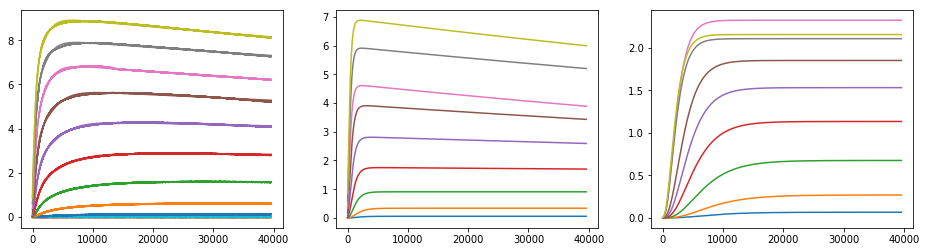

In [27]:
p0 = [
    [1.13871334e-03, 1.14416165e+03, 1.33596866e-03, 4.49266985e+03, 1.00000000e+00, 5.33467018e+06],
    [2.69442577e-03, 1.54214748e+03, 3.21077710e-03, 4.85178493e+03, 2.41293884e-04, 4.37674485e+06],
    [1.26052377e-02, 7.18013952e+02, 9.77359960e-03, 3.79804402e+03, 1.00000000e+00, 6.99205317e+06],
    [2.23749646e-02, 6.32921683e+02, 1.43909619e-02, 2.97062426e+03, 3.10986140e-14, 1.14995553e+06],
    [3.22329595e-02, 5.14346559e+02, 1.73674386e-02, 2.42883568e+03, 1.30379837e-15, 4.38244582e+05],
    [4.06874413e-02, 4.27625867e+02, 1.89971803e-02, 1.97436574e+03, 1.43813489e-17, 2.78153224e+05],
    [4.41661886e-02, 3.40250162e+02, 2.19443513e-02, 1.33750010e+03, 2.66922783e-20, 2.17166052e+05],
    [5.17170144e-02, 3.18270155e+02, 1.82299099e-02, 1.29819642e+03, 1.15155176e-15, 2.88816838e+05],
    [5.56846467e-02, 2.92091405e+02, 1.72473115e-02, 1.20603162e+03, 1.80954496e-19, 2.68969067e+05],
]
allfits[10], cost = fit_single(ana[10], p0)
print cost

[3.00570063e-03, 1.14416165e+03, 3.00739607e-03, 4.49266985e+03, 1.00000000e+00, 5.33467018e+06],  1.2201e+01
[1.55420112e-02, 1.33850596e+03, 1.07319075e-02, 4.99998771e+03, 1.00000000e+00, 2.36473760e+08],  3.4064e+00
[3.34466098e-02, 8.32921206e+02, 1.98253387e-02, 3.73091478e+03, 9.99999996e-01, 1.39848214e+07],  3.0646e+01
[5.59571764e-02, 6.35319040e+02, 2.37760783e-02, 2.73467488e+03, 2.45170822e-13, 1.03931201e+06],  3.1888e+01
[7.34387513e-02, 4.64536598e+02, 2.73055204e-02, 1.90315416e+03, 3.99893480e-19, 8.42908236e+05],  4.1510e+01
[9.41829734e-02, 3.88961050e+02, 2.73130768e-02, 2.09920205e+03, 3.92241117e-21, 6.19866495e+05],  1.2685e+02
[1.06612840e-01, 3.16373914e+02, 3.14027667e-02, 1.76594967e+03, 1.29093632e-26, 4.60563617e+05],  1.5653e+02
[1.16022359e-01, 2.62386223e+02, 3.42398366e-02, 1.33527982e+03, 1.50203425e-28, 4.85245731e+05],  1.8782e+02
[1.26313335e-01, 2.29174460e+02, 3.62424539e-02, 1.15855999e+03, 4.28328491e-32, 4.06235802e+05],  2.9092e+02
881.769161

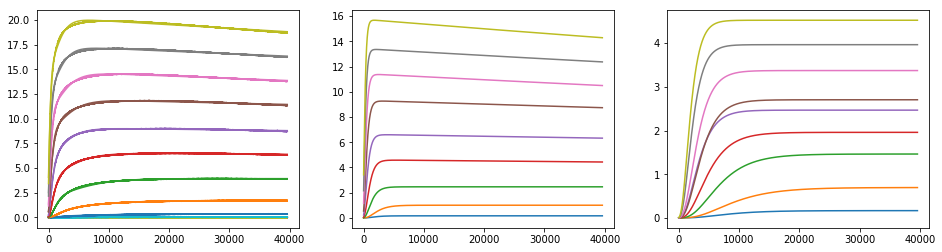

In [28]:
p0 = [
    [1.13871334e-03, 1.14416165e+03, 1.33596866e-03, 4.49266985e+03, 1.00000000e+00, 5.33467018e+06],
    [2.69442577e-03, 1.54214748e+03, 3.21077710e-03, 4.85178493e+03, 2.41293884e-04, 4.37674485e+06],
    [1.26052377e-02, 7.18013952e+02, 9.77359960e-03, 3.79804402e+03, 1.00000000e+00, 6.99205317e+06],
    [2.23749646e-02, 6.32921683e+02, 1.43909619e-02, 2.97062426e+03, 3.10986140e-14, 1.14995553e+06],
    [3.22329595e-02, 5.14346559e+02, 1.73674386e-02, 2.42883568e+03, 1.30379837e-15, 4.38244582e+05],
    [4.06874413e-02, 4.27625867e+02, 1.89971803e-02, 1.97436574e+03, 1.43813489e-17, 2.78153224e+05],
    [4.41661886e-02, 3.40250162e+02, 2.19443513e-02, 1.33750010e+03, 2.66922783e-20, 2.17166052e+05],
    [5.17170144e-02, 3.18270155e+02, 1.82299099e-02, 1.29819642e+03, 1.15155176e-15, 2.88816838e+05],
    [5.56846467e-02, 2.92091405e+02, 1.72473115e-02, 1.20603162e+03, 1.80954496e-19, 2.68969067e+05],
]
allfits[11], cost = fit_single(ana[11], p0)
print cost

[2.21148269e-03, 1.14416165e+03, 2.30598968e-03, 4.49266985e+03, 1.00000000e+00, 5.33467018e+06],  7.3896e+00
[1.20408123e-02, 1.39967053e+03, 8.93553596e-03, 5.70469025e+03, 9.99999999e-01, 2.45097712e+08],  4.3398e+00
[2.46181914e-02, 8.23233182e+02, 2.10014925e-02, 3.78842902e+03, 9.99994337e-01, 1.74810267e+04],  2.8637e+01
[4.58815782e-02, 6.71611570e+02, 2.56859118e-02, 3.09161565e+03, 7.98859325e-06, 1.35378378e+07],  3.4856e+01
[6.42325571e-02, 5.09003044e+02, 3.17702730e-02, 2.41816312e+03, 3.59551987e-20, 7.06661401e+05],  7.9854e+01
[7.95310255e-02, 3.96975902e+02, 3.58668505e-02, 1.82730218e+03, 1.77318084e-26, 4.76262768e+05],  1.2607e+02
[9.36111849e-02, 3.24201892e+02, 3.81454138e-02, 1.48863212e+03, 4.32220704e-31, 3.99701531e+05],  1.8461e+02
[1.04116518e-01, 2.68736411e+02, 4.01815859e-02, 1.20214301e+03, 1.30269031e-30, 3.95027960e+05],  2.2531e+02
[1.12936557e-01, 2.29013148e+02, 4.16923504e-02, 1.00698061e+03, 8.63224041e-32, 3.84848741e+05],  2.4678e+02
937.852607

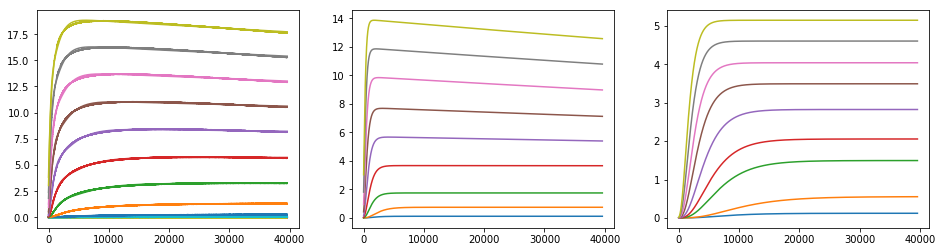

In [29]:
p0 = [
    [1.13871334e-03, 1.14416165e+03, 1.33596866e-03, 4.49266985e+03, 1.00000000e+00, 5.33467018e+06],
    [2.69442577e-03, 1.54214748e+03, 3.21077710e-03, 4.85178493e+03, 2.41293884e-04, 4.37674485e+06],
    [1.26052377e-02, 7.18013952e+02, 9.77359960e-03, 3.79804402e+03, 1.00000000e+00, 6.99205317e+06],
    [2.23749646e-02, 6.32921683e+02, 1.43909619e-02, 2.97062426e+03, 3.10986140e-14, 1.14995553e+06],
    [3.22329595e-02, 5.14346559e+02, 1.73674386e-02, 2.42883568e+03, 1.30379837e-15, 4.38244582e+05],
    [4.06874413e-02, 4.27625867e+02, 1.89971803e-02, 1.97436574e+03, 1.43813489e-17, 2.78153224e+05],
    [4.41661886e-02, 3.40250162e+02, 2.19443513e-02, 1.33750010e+03, 2.66922783e-20, 2.17166052e+05],
    [5.17170144e-02, 3.18270155e+02, 1.82299099e-02, 1.29819642e+03, 1.15155176e-15, 2.88816838e+05],
    [5.56846467e-02, 2.92091405e+02, 1.72473115e-02, 1.20603162e+03, 1.80954496e-19, 2.68969067e+05],
]
allfits[12], cost = fit_single(ana[12], p0)
print cost

[3.37509769e-03, 1.14416165e+03, 3.24485158e-03, 4.49266985e+03, 1.00000000e+00, 5.33467018e+06],  6.1536e+00
[1.58974970e-02, 9.35020864e+02, 9.04359730e-03, 4.50260284e+03, 9.99999965e-01, 1.90147221e+10],  9.5663e+00
[3.55929577e-02, 6.66651049e+02, 1.63053116e-02, 3.63452279e+03, 1.00000000e+00, 2.79703579e+07],  2.2141e+01
[5.50063216e-02, 4.60043950e+02, 2.41743002e-02, 2.61205564e+03, 1.00000000e+00, 7.71589167e+08],  4.9999e+01
[7.47805284e-02, 3.52341529e+02, 3.00119599e-02, 2.10126549e+03, 4.23090015e-20, 1.07377723e+06],  1.0744e+02
[9.16566523e-02, 2.80065980e+02, 3.45495917e-02, 1.67336853e+03, 4.57124151e-28, 7.56209530e+05],  1.8092e+02
[1.05557846e-01, 2.30926964e+02, 3.80630254e-02, 1.34282297e+03, 3.53761092e-31, 6.03573071e+05],  2.5974e+02
[1.17045569e-01, 1.96221166e+02, 4.06687805e-02, 1.08871038e+03, 4.98196386e-31, 4.46050118e+05],  2.9519e+02
[1.20175883e-01, 1.59937481e+02, 4.54558425e-02, 7.41502461e+02, 1.71862325e-23, 5.53666666e+05],  1.1274e+02
1043.88049

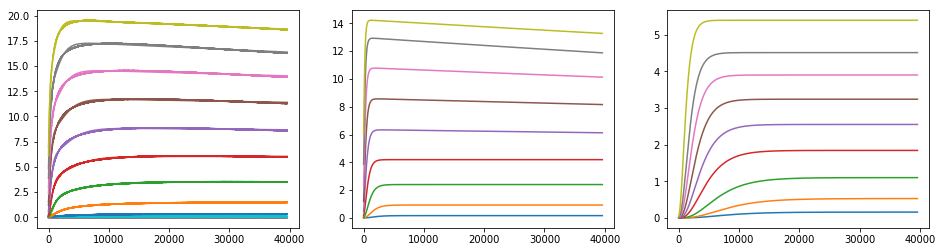

In [30]:
p0 = [
    [1.13871334e-03, 1.14416165e+03, 1.33596866e-03, 4.49266985e+03, 1.00000000e+00, 5.33467018e+06],
    [2.69442577e-03, 1.54214748e+03, 3.21077710e-03, 4.85178493e+03, 2.41293884e-04, 4.37674485e+06],
    [1.26052377e-02, 7.18013952e+02, 9.77359960e-03, 3.79804402e+03, 1.00000000e+00, 6.99205317e+06],
    [2.23749646e-02, 6.32921683e+02, 1.43909619e-02, 2.97062426e+03, 3.10986140e-14, 1.14995553e+06],
    [3.22329595e-02, 5.14346559e+02, 1.73674386e-02, 2.42883568e+03, 1.30379837e-15, 4.38244582e+05],
    [4.06874413e-02, 4.27625867e+02, 1.89971803e-02, 1.97436574e+03, 1.43813489e-17, 2.78153224e+05],
    [4.41661886e-02, 3.40250162e+02, 2.19443513e-02, 1.33750010e+03, 2.66922783e-20, 2.17166052e+05],
    [5.17170144e-02, 3.18270155e+02, 1.82299099e-02, 1.29819642e+03, 1.15155176e-15, 2.88816838e+05],
    [5.56846467e-02, 2.92091405e+02, 1.72473115e-02, 1.20603162e+03, 1.80954496e-19, 2.68969067e+05],
]
allfits[13], cost = fit_single(ana[13], p0)
print cost

[3.69646067e-04, 5.91803205e+01, 9.14738154e-06, 1.63824990e+07, 1.99847333e-05, 1.72672555e+05],  2.1979e+00
[4.47721782e-04, 3.03883858e+01, 1.00407057e-04, 4.81982178e+03, 1.00000000e+00, 3.51304846e+06],  2.2060e+00
[5.58749114e-04, 1.57597937e+02, 5.87483634e-04, 4.12737286e+03, 1.00000000e+00, 3.38664512e+06],  2.0945e+00
[7.27325738e-04, 2.27220405e+02, 1.10059731e-03, 2.61814414e+03, 1.00000000e+00, 6.48147768e+07],  8.4248e-01
[1.41824581e-03, 4.96638179e+02, 1.15619830e-03, 2.32118636e+03, 1.81245028e-05, 7.87796142e+04],  6.6498e-01
[1.57496183e-03, 3.75939420e+02, 1.31413397e-03, 1.80158417e+03, 4.28841982e-34, 9.02158873e+04],  6.2943e-01
[1.95490627e-03, 3.40794602e+02, 1.20962648e-03, 1.54281162e+03, 3.19909429e-32, 8.24491588e+04],  6.1845e-01
[1.72579502e-03, 2.68624298e+02, 1.18338118e-03, 1.02978090e+03, 2.02843077e-09, 1.05818922e+06],  7.4859e-01
[1.98698967e-03, 2.57393220e+02, 9.39999639e-04, 1.02024454e+03, 1.00000000e+00, 4.33901383e+07],  7.7102e-01
10.7733808

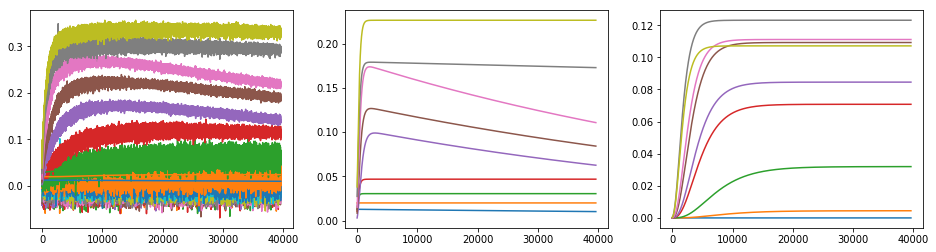

In [31]:
p0 = [
    [1.13871334e-03, 1.14416165e+03, 1.33596866e-03, 4.49266985e+03, 1.00000000e+00, 5.33467018e+06],
    [2.69442577e-03, 1.54214748e+03, 3.21077710e-03, 4.85178493e+03, 2.41293884e-04, 4.37674485e+06],
    [1.26052377e-02, 7.18013952e+02, 9.77359960e-03, 3.79804402e+03, 1.00000000e+00, 6.99205317e+06],
    [2.23749646e-02, 6.32921683e+02, 1.43909619e-02, 2.97062426e+03, 3.10986140e-14, 1.14995553e+06],
    [3.22329595e-02, 5.14346559e+02, 1.73674386e-02, 2.42883568e+03, 1.30379837e-15, 4.38244582e+05],
    [4.06874413e-02, 4.27625867e+02, 1.89971803e-02, 1.97436574e+03, 1.43813489e-17, 2.78153224e+05],
    [1.57496183e-03, 3.75939420e+02, 1.31413397e-03, 1.80158417e+03, 4.28841982e-34, 9.02158873e+04],
    [5.17170144e-02, 3.18270155e+02, 1.82299099e-02, 1.29819642e+03, 1.15155176e-15, 2.88816838e+05],
    [5.56846467e-02, 2.92091405e+02, 1.72473115e-02, 1.20603162e+03, 1.80954496e-19, 2.68969067e+05],
]
allfits[14], cost = fit_single(ana[14], p0)
print cost

With these nice separating fits in hand, let's have a look at the voltage dependency of these params:

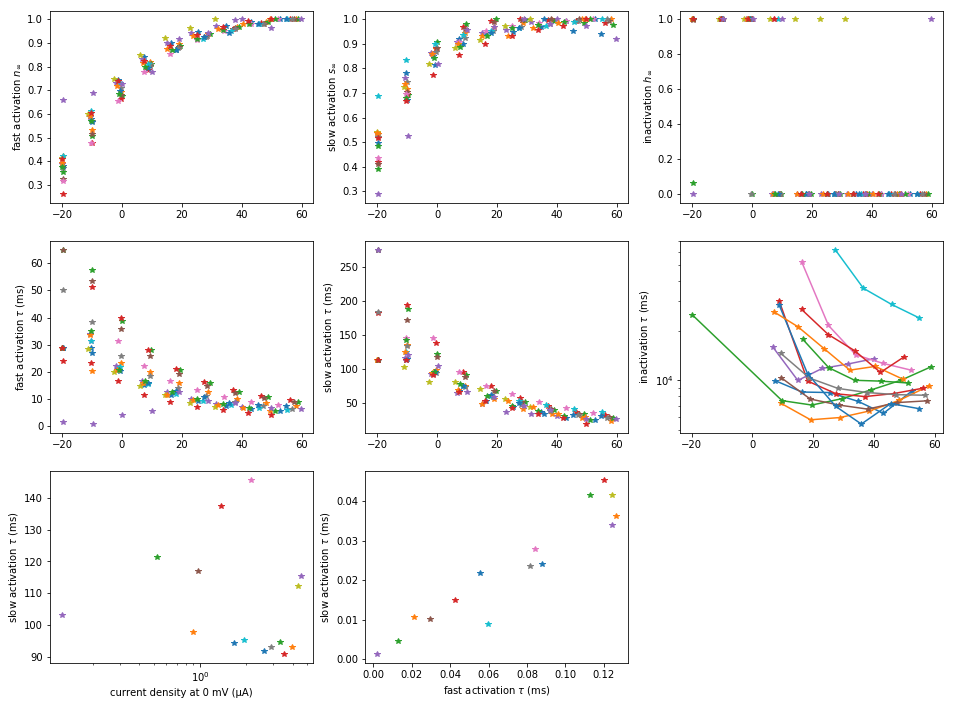

In [66]:
plt.figure(figsize=(16,12))

plt.subplot(3,3,1).set_ylabel(r'fast activation $n_\infty$')
plt.subplot(3,3,2).set_ylabel(r'slow activation $s_\infty$')
plt.subplot(3,3,3).set_ylabel(r'inactivation $h_\infty$')
plt.subplot(3,3,4).set_ylabel(r'fast activation $\tau$ (ms)')
plt.subplot(3,3,5).set_ylabel(r'slow activation $\tau$ (ms)')
plt.subplot(3,3,6).set_ylabel(r'inactivation $\tau$ (ms)')
plt.subplot(3,3,7).set_xlabel(u'current density at 0 mV (μA)')
plt.subplot(3,3,7).set_ylabel(r'slow activation $\tau$ (ms)')
plt.subplot(3,3,8).set_xlabel(r'fast activation $\tau$ (ms)')
plt.subplot(3,3,8).set_ylabel(r'slow activation $\tau$ (ms)')

V, n, s, h, tn, ts, th, Vth = [],[],[],[],[],[],[],[]


for i, a in enumerate(ana):
    ret, V_ = zip(*allfits[i])
    params = [r.x for r in ret]
    V_ += a.params['E_K']
    V.extend(V_)
    
    # fast activation
    plt.subplot(3, 3, 1)
    p = [el[0] for el in params]
    n_ = [(el / max(p))**0.25 for el in p]
    n.extend(n_)
    plt.plot(V_, n_, '*')
    a.params['gK_fast'] = max(p)
    
    # slow activation
    plt.subplot(3, 3, 2)
    p = [el[2] for el in params]
    s_ = [(el / max(p))**0.25 for el in p]
    s.extend(s_)
    plt.plot(V_, s_, '*')
    a.params['gK_slow'] = max(p)
    
    # inactivation
    plt.subplot(3,3,3)
    h_ = [el[4] for el in params]
    h.extend(h_)
    plt.plot(V_, h_, '*')
    
    # fast activation tau
    plt.subplot(3,3,4)
    tn_ = [(el[1] if el[1] < 2500 else 2600) * Kv21.tres for el in params]
    tn.extend(tn_)
    plt.plot(V_, tn_, '*')
    
    # slow activation tau
    plt.subplot(3,3,5)
    ts_ = [(el[3] if el[3] < 1e4 else 1.1e4) * Kv21.tres for el in params]
    ts.extend(ts_)
    plt.plot(V_, ts_, '*')
    
    # inactivation tau
    # exclude fits that show no appreciable inactivation (h ~= 1 and tau > 10 s)
    # also, exclude the very noisy and outlier-rich recording 14
    plt.subplot(3,3,6)
    th_, Vth_ = [],[]
    for v, hinf, el in zip(V_, h_, params):
        if hinf < 0.5 and el[5] * Kv21.tres < 1e5 and i!=14:
            th_.append(el[5] * Kv21.tres)
            Vth_.append(v)
    Vth.extend(Vth_)
    th.extend(th_)
    plt.semilogy(Vth_, th_, '*-')
    
    plt.subplot(3,3,7)
    plt.semilogx(max(a.rec.current[-7][Kv21.rec_limits[0]:Kv21.rec_limits[1]]), ts_[-7], '*')
    
    plt.subplot(3,3,8)
    plt.plot(a.params['gK_fast'], a.params['gK_slow'], '*')

In [34]:
for a in ana:
    print '%s:\n%s\n' % (a.paramsfile, a.params_str())
    a.write()

/home/kernfel/Documents/Data/Oocytes/2017_12_06_0002.params:
gl:	5.366976 μS
El:	-11.139315 mV
gK:	115.917106 μS
EK:	-64.654539 mV
C:	215.597691 nF
gK_fast:	88.049807 μS
gK_slow:	24.276960 μS


/home/kernfel/Documents/Data/Oocytes/2017_12_06_0006.params:
gl:	7.268110 μS
El:	-3.133907 mV
gK:	33.028666 μS
EK:	-75.477615 mV
C:	168.940206 nF
gK_fast:	21.115328 μS
gK_slow:	10.711065 μS


/home/kernfel/Documents/Data/Oocytes/2017_12_06_0011.params:
gl:	5.215766 μS
El:	-16.249766 mV
gK:	17.960338 μS
EK:	-68.354803 mV
C:	214.074582 nF
gK_fast:	12.813137 μS
gK_slow:	4.768064 μS


/home/kernfel/Documents/Data/Oocytes/2017_12_06_0015.params:
gl:	7.606710 μS
El:	-12.861644 mV
gK:	58.694057 μS
EK:	-72.357433 mV
C:	170.574145 nF
gK_fast:	42.602444 μS
gK_slow:	15.078695 μS


/home/kernfel/Documents/Data/Oocytes/2017_12_06_0019.params:
gl:	1.778553 μS
El:	4.785647 mV
gK:	155.997672 μS
EK:	-84.979890 mV
C:	217.697700 nF
gK_fast:	124.368099 μS
gK_slow:	33.907422 μS


/home/kernfel/Documents/Data/Oocytes

V_half =  -13.691318347275992
V_slope =  14.786142374696247


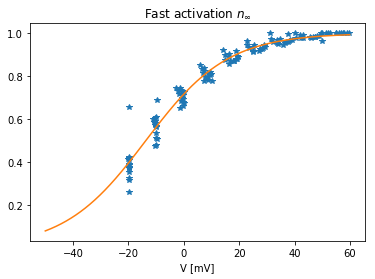

In [35]:
def sigmoid(p, v):
    return 1/(1+np.exp((p[0]-v)/p[1]))
Vprobe = np.arange(-50,60,0.1)
fit_n = scipy.optimize.least_squares(lambda p, x, y: sigmoid(p,x) - y, [10, 10], args = (V, n))
plt.plot(V, n, '*')
plt.plot(Vprobe, sigmoid(fit_n.x, Vprobe))
plt.title(r'Fast activation $n_\infty$')
plt.xlabel('V [mV]')
print 'V_half = ', fit_n.x[0]
print 'V_slope = ', fit_n.x[1]

V_half =  -19.674039416127236
V_slope =  11.099107346739641


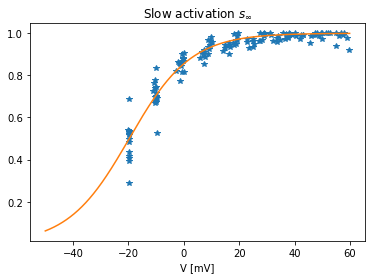

In [36]:
fit_s = scipy.optimize.least_squares(lambda p, x, y: sigmoid(p,x) - y, [10, 10], args = (V, s))
plt.plot(V, s, '*')
plt.plot(Vprobe, sigmoid(fit_s.x, Vprobe))
plt.title(r'Slow activation $s_\infty$')
plt.xlabel('V [mV]')
print 'V_half = ', fit_s.x[0]
print 'V_slope = ', fit_s.x[1]

V_half =  5.8371442815085945
V_slope =  -3.911529536316267


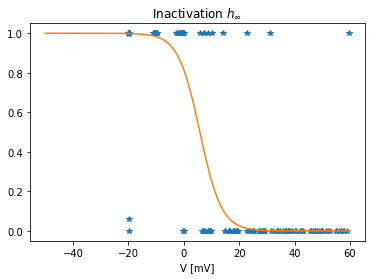

In [37]:
fit_h = scipy.optimize.least_squares(lambda p, x, y: sigmoid(p,x) - y, [10, -.1], args = (V, h))
plt.plot(V, h, '*')
plt.plot(Vprobe, sigmoid(fit_h.x, Vprobe))
plt.title(r'Inactivation $h_\infty$')
plt.xlabel('V [mV]')
print 'V_half = ', fit_h.x[0]
print 'V_slope = ', fit_h.x[1]

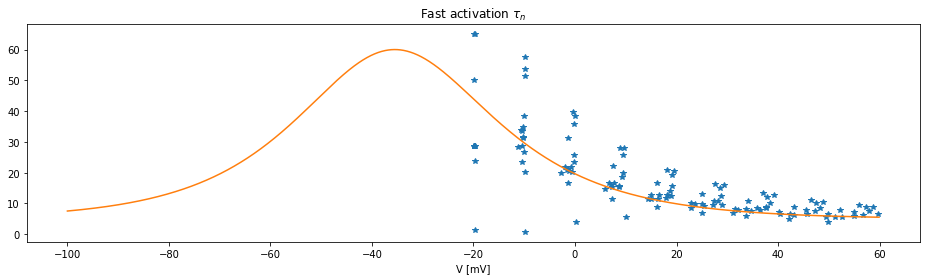

In [38]:
taun_p0 = [5., 110., 36., 18., -17.]
def tau_model(p, V):
#   tau_min + tau_max/(np.exp((tau_off+V)/tau_slope1) + np.exp((tau_off+V)/tau_slope2))
    return p[0] + p[1]/(np.exp((p[2]+V)/p[3]) + np.exp((p[2]+V)/p[4]))

Vprobe = np.arange(-100,60,0.1)

plt.figure(figsize=(16,4))
plt.plot(V, tn, '*')
plt.plot(Vprobe, tau_model(taun_p0, Vprobe))

plt.title(r'Fast activation $\tau_n$')
plt.xlabel('V [mV]');

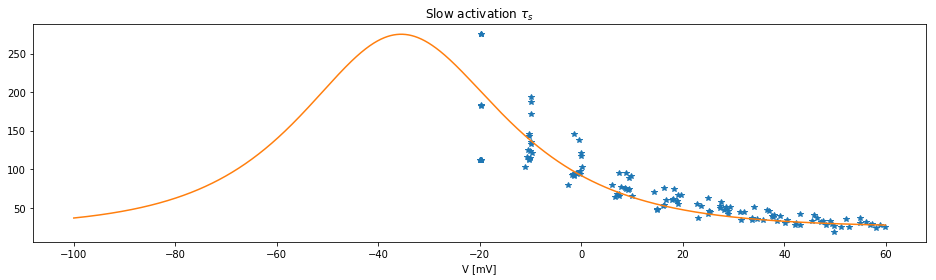

In [39]:
taus_p0 = [25., 500., 36., 18., -17.]

plt.figure(figsize=(16,4))
plt.plot(V, ts, '*')
plt.plot(Vprobe, tau_model(taus_p0, Vprobe))

plt.title(r'Slow activation $\tau_s$')
plt.xlabel('V [mV]');

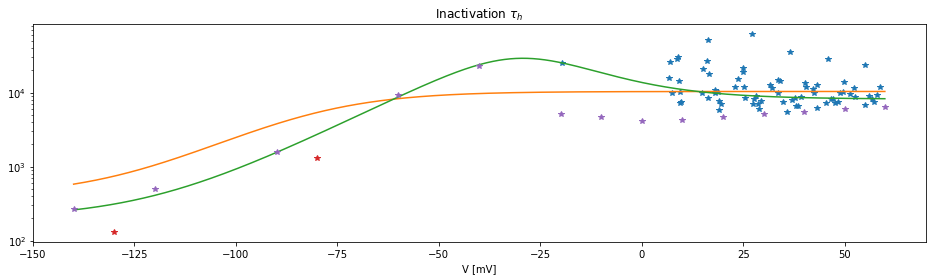

In [40]:
taui_p0 = [400., 10000., -80., 15.]
def taui_model(p, V):
#     $(tauhK_min) + $(tauhK_max)/(1.0 + exp(($(tauhK_mid)-$(V))/$(tauhK_slope)))
    return p[0] + p[1]/(1. + np.exp((p[2]-V)/p[3]))

Vprobe = np.arange(-140,60,0.1)

plt.figure(figsize=(16,4))
plt.semilogy(Vth, th, '*')
plt.semilogy(Vprobe, taui_model(taui_p0, Vprobe))

tauia_p = [8e3, 5e4, -30., 15., -16., 200.]
def taui_asymmetric(p, V):
    rexp = np.exp((V-p[2])/p[3])
    lexp = np.exp((V-p[2])/p[4])
    return p[5] + p[0]/(1+lexp) + p[1]/(lexp + rexp)
plt.semilogy(Vprobe, taui_asymmetric(tauia_p, Vprobe))

plt.semilogy([-130, -80], [131, 1308], '*') # Kerschensteiner
plt.semilogy([-140, -120, -90, -60, -40] + range(-20,61,10),
             [  270.551126441926,
                499.170537705386,
                1573.97630534975,
                9393.56295904351,
                22948.0839868864,
                5222.92836440641,
                4716.07608459138,
                4151.10979174849,
                4313.09669775924,
                4656.28060527803,
                5156.70646735319,
                5567.0146054279,
                5933.76922958617,
                6324.68562874863], '*') # Klemic

plt.title(r'Inactivation $\tau_h$')
plt.xlabel('V [mV]');

I don't have any data of my own for recovery from inactivation, but the few data points gleaned from the Klemic 1998 and Kerschensteiner 1999 papers help, for what they're worth.
Now for the money shot: How do these values match the tail currents?

In [41]:
def state_at(t, V, state):
    '''Calculates the state (n,s,h) after @a t ms of holding at @a V mV from an initial @a state'''
    
    ninf = sigmoid(fit_n.x, V)
    taun = tau_model(taun_p0, V)
    n = ninf - (ninf-state[0]) * np.exp(-t/taun)

    sinf = sigmoid(fit_s.x, V)
    taus = tau_model(taus_p0, V)
    s = sinf - (sinf-state[1]) * np.exp(-t/taus)

    hinf = sigmoid(fit_h.x, V)
    tauh = taui_asymmetric(tauia_p, V)
    h = hinf - (hinf-state[2]) * np.exp(-t/tauh)
    
    return (n, s, h)

def HH_state0(t, V, params, state0):
    state = state_at(t, V, state0)
    return (V - params['E_K']) * (params['gK_fast'] * state[0]**4 * state[2] + params['gK_slow'] * state[1]**4)

3.66004317556506
2.9273364957362094
1.7131324763622455
1.0665033771649952
1.6110135164029225
0.2497916373959009
5.027263466513013
0.7101929084317359
1.6728846102064097
6.086243130616869
0.4953866407995566
0.5353301900100166
1.6780129806680026
6.103417238487255
0.8283132653839845

2.290991007316278


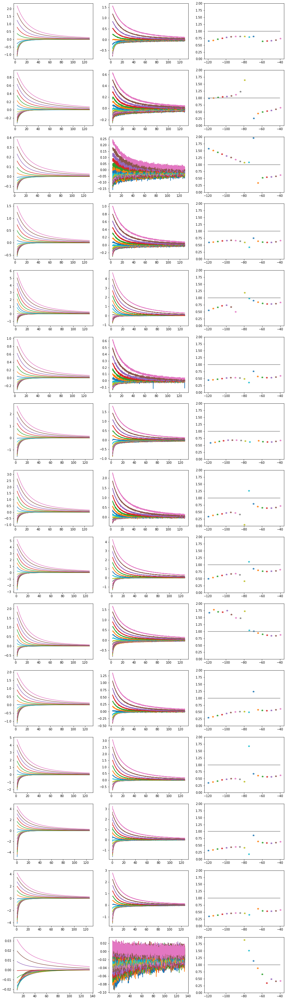

In [42]:
plt.figure(figsize=(16,4*len(ana)))
dur = 5000

kfits = [[0 for x in range(len(ana[0].rec2.current))] for y in range(len(ana))]
tailV = [[0 for x in range(len(ana[0].rec2.current))] for y in range(len(ana))]

mean_cost = 0.
for j,a in enumerate(ana):
    t0 = a.rec2.tail_cut
    t = np.arange(t0 - Kv21.rec2_limits[0], t0+dur - Kv21.rec2_limits[0]) * Kv21.tres
    sum_cost = 0.
    
    for i, current, voltage, tail_baseline in zip(range(len(a.rec2.current)),
                                                  a.rec2.current,
                                                  a.rec2.voltage,
                                                  a.rec2.tail_baseline):
        state_after_prepulse = state_at(Kv21.tres*(Kv21.rec2_limits[0]-Kv21.rec2_prepulse),
                                        np.median(voltage[Kv21.rec2_prepulse:Kv21.rec2_limits[0]]),
                                        (0,0,1))
        
        medV = np.median(voltage[t0:t0+dur])
        model_current = HH_state0(t, medV, a.params, state_after_prepulse)
        exp_current = current[t0:t0+dur] - tail_baseline
        
        fit = scipy.optimize.least_squares(lambda p, x, y: p*x - y, 1., args = (model_current, exp_current))
        sum_cost += fit.cost
        
        kfits[j][i] = fit.x[0]
        tailV[j][i] = medV

        plt.subplot(len(ana),3,3*j+1)
        plt.plot(t, model_current)

        plt.subplot(len(ana),3,3*j+2)
        plt.plot(t, exp_current)
        
        plt.subplot(len(ana),3,3*j+3)
        plt.plot(medV, fit.x, '*')
        
    plt.plot([-120,-40], [1,1])
    plt.ylim(0,2)
    
    cost = sum_cost/len(a.rec2.current)
    mean_cost += cost
    print cost
print
print mean_cost/len(ana)

Above:
* Left column: expected tail currents from kinetics as modelled above
* Central column: measured tail currents, baseline removed
* Right column: Factor k that minimises $(k*I_{model} - I_{measured})^2$ for each trace

In a perfect world, this factor should be 1 (perfect correspondence between model and measurement). It has been very clear from comparing tail fit I/V to activation protocol I/V curves, however, that something is off. Namely, the tail fit I/V has consistently shown less current than expected, which is well replicated here in most cases ($k<1$).

Given the nearly linear relationship of the fitted k to voltage, one might expect that there is some kind of additional ohmic resistance, e.g. a depolarisation-deactivated leak current or somesuch with kinetics (much) slower than the potassium deactivation, we'd expect to see a change in the leak current. Below, I've plotted $I_{leak}$ as derived from the activation protocol (blue), the tail current baseline (final 10 ms of the tail, orange), and the residual current during the 5 ms immediately following the tails used above (green). The good match between these measurements indicates that the leak current is not active.

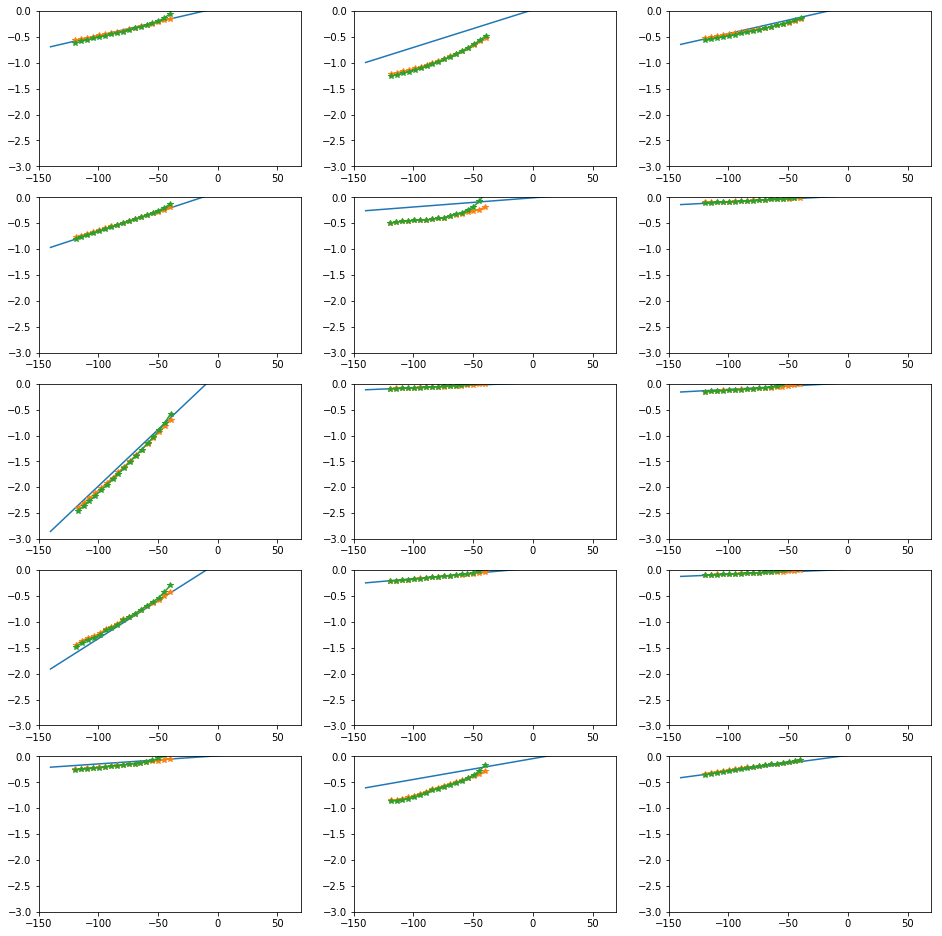

In [43]:
plt.figure(figsize=(16,4*len(ana)/3))
for i, a in enumerate(ana):
    plt.subplot(len(ana)/3+1, 3, i+1)
    plt.plot(Vprobe, a.params['I_leak'](Vprobe))
    plt.plot(tailV[i], a.rec2.tail_baseline, '*-')
    plt.plot(tailV[i], [np.median(I[a.rec2.tail_cut+dur:a.rec2.tail_cut+dur+int(5/Kv21.tres)]) \
                        for I in a.rec2.current], '*-')
    plt.ylim(-3,0)

Previous speculation as to the reason for the tail current discrepancy has been that there may be a very fast deactivation that is masked by the capacitance spike. Let's assume that one of the current components follows such a very fast deactivation, and try to fit it:

2.3289811936340827


/usr/lib/python2.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: overflow encountered in exp
  # This is added back by InteractiveShellApp.init_path()
/usr/lib/python2.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: overflow encountered in power


0.7833354289433675
0.2593022264322541
0.8523320737676814
5.427065475897755
0.19311597691562962
3.4680979464410417


/usr/lib/python2.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: overflow encountered in multiply


1.5457962737453368
4.377076956858326
1.3979674623024123
0.5418083883547924
5.167232653687322
8.099884635942871
6.5793634230946
0.042611375748558104

2.7375980994510685


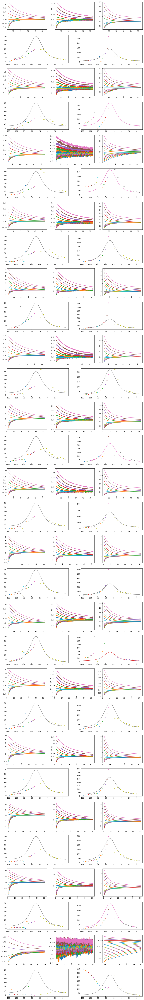

In [44]:
plt.figure(figsize=(16,8*len(ana)))
dur = 2000

def tau_guess(V):
    taun = tau_model(taun_p0, V)
    taus = tau_model(taus_p0, V)
    return (taun, taus)
    
def state_fixedtau(t, V, state, tau):
    ninf = sigmoid(fit_n.x, V)
    n = ninf - (ninf-state[0]) * np.exp(-t/tau[0])

    sinf = sigmoid(fit_s.x, V)
    s = sinf - (sinf-state[1]) * np.exp(-t/tau[1])

    hinf = sigmoid(fit_h.x, V)
    tauh = taui_asymmetric(tauia_p, V)
    h = hinf - (hinf-state[2]) * np.exp(-t/tauh)
    
    return (n, s, h)

def HH_state0_tau(t, V, params, state0, tau):
    state = state_fixedtau(t, V, state0, tau)
    return (V - params['E_K']) * (params['gK_fast'] * state[0]**4 * state[2] + params['gK_slow'] * state[1]**4)

taufits_fs_f = [[0 for x in range(len(ana[0].rec2.current))] for y in range(len(ana))]
taufits_fs_s = [[0 for x in range(len(ana[0].rec2.current))] for y in range(len(ana))]

mean_cost = 0.
for j,a in enumerate(ana):
    t0 = a.rec2.tail_cut
    t = np.arange(t0 - Kv21.rec2_limits[0], t0+dur - Kv21.rec2_limits[0]) * Kv21.tres
    sum_cost = 0.
    
    for i, current, voltage, tail_baseline in zip(range(len(a.rec2.current)),
                                                  a.rec2.current,
                                                  a.rec2.voltage,
                                                  a.rec2.tail_baseline):
        state_after_prepulse = state_at(Kv21.tres*(Kv21.rec2_limits[0]-Kv21.rec2_prepulse),
                                        np.median(voltage[Kv21.rec2_prepulse:Kv21.rec2_limits[0]]),
                                        (0,0,1))
        
        medV = tailV[j][i]
        model_current = HH_state0(t, medV, a.params, state_after_prepulse)
        exp_current = current[t0:t0+dur] - tail_baseline
        
        fit = scipy.optimize.least_squares(lambda p, x, y:
                   HH_state0_tau(x, medV, a.params, state_after_prepulse, p) - y,
                                           tau_guess(medV),
                                           args = (t, exp_current))
        sum_cost += fit.cost

        plt.subplot(2*len(ana),3,6*j+1)
        plt.plot(t, model_current)

        plt.subplot(2*len(ana),3,6*j+2)
        plt.plot(t, exp_current)
        
        plt.subplot(2*len(ana),3,6*j+3)
        plt.plot(t, HH_state0_tau(t, medV, a.params, state_after_prepulse, fit.x))
    
        plt.subplot(2*len(ana),2,4*j+3)
        plt.plot(medV, fit.x[0], '*')
    
        if fit.x[1] < 1000:
            plt.subplot(2*len(ana),2,4*j+4)
            plt.plot(medV, fit.x[1], '*')
            
            taufits_fs_s[j][i] = fit.x[1]
        taufits_fs_f[j][i] = fit.x[0]
    
    Vprobe = np.arange(-120, 60, 0.1)
    tauprobe = tau_guess(Vprobe)
    
    ret, V_ = zip(*allfits[j])
    params = [r.x for r in ret]
    V_ += a.params['E_K']
    tn_ = [(el[1] if el[1] < 2500 else 2600) * Kv21.tres for el in params]
    ts_ = [(el[3] if el[3] < 1e4 else 1.1e4) * Kv21.tres for el in params]
    
    plt.subplot(2*len(ana),2,4*j+3)
    plt.plot(Vprobe, tauprobe[0])
    plt.plot(V_, tn_, '*')

    plt.subplot(2*len(ana),2,4*j+4)
    plt.plot(Vprobe, tauprobe[1])
    plt.plot(V_, ts_, '*')
    
    cost = sum_cost/len(a.rec2.current)
    mean_cost += cost
    print cost
print
print mean_cost/len(ana)

Above:
* First row, left and center: expected and measured tail currents as before
* First row, right: Modelled tail currents using $\tau_f$ and $\tau_s$ fit to the measured traces
* Second row: (left: $\tau_f$, right: $\tau_s$, concurrent fit) fit $\tau$ (trace colours), corresponding activation $\tau$ fits (green), and model curve

The expectation of a lower $\tau$ seems to be borne out, but notice how a linear scaling of the original modelled tail currents ($k$ in the previous figure) provides a better fit than these individual $\tau$ adjustments; see printed costs above and overlays below (left: linear scaling, right: fit $\tau$):

/usr/lib/python2.7/site-packages/ipykernel_launcher.py:14: RuntimeWarning: divide by zero encountered in divide
  


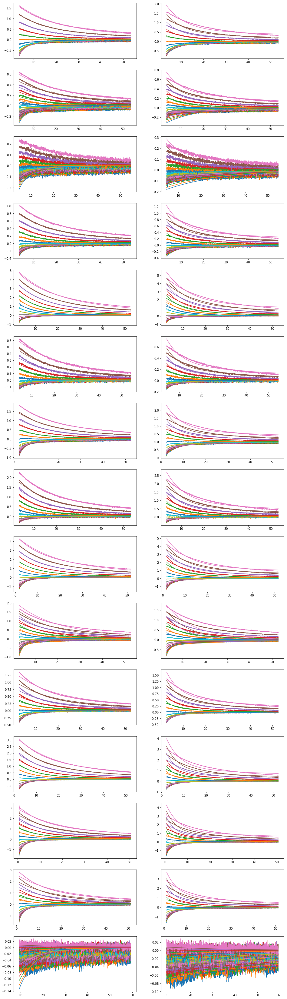

In [45]:
plt.figure(figsize=(16,4*len(ana)))
for j,a in enumerate(ana):
    t0 = a.rec2.tail_cut
    t = np.arange(t0 - Kv21.rec2_limits[0], t0+dur - Kv21.rec2_limits[0]) * Kv21.tres
    
    for current, baseline in zip(a.rec2.current, a.rec2.tail_baseline):
        exp_current = current[t0:t0+dur] - baseline
        
        plt.subplot(len(ana),2,2*j+1)
        plt.plot(t, exp_current)
        
        plt.subplot(len(ana),2,2*j+2)
        plt.plot(t, exp_current)
    
    plt.subplot(len(ana),2,2*j+1)
    plt.gca().set_prop_cycle(None)

    plt.subplot(len(ana),2,2*j+2)
    plt.gca().set_prop_cycle(None)
    
    for voltage, medV, k, tauf, taus in zip(a.rec2.voltage, tailV[j], kfits[j], taufits_fs_f[j], taufits_fs_s[j]):
        state_after_prepulse = state_at(Kv21.tres*(Kv21.rec2_limits[0]-Kv21.rec2_prepulse),
                                        np.median(voltage[Kv21.rec2_prepulse:Kv21.rec2_limits[0]]),
                                        (0,0,1))
        
        k_current = HH_state0(t, medV, a.params, state_after_prepulse) * k
        tau_current = HH_state0_tau(t, medV, a.params, state_after_prepulse, (tauf, taus))
        
        plt.subplot(len(ana),2,2*j+1)
        plt.plot(t, k_current)
        
        plt.subplot(len(ana),2,2*j+2)
        plt.plot(t, tau_current)

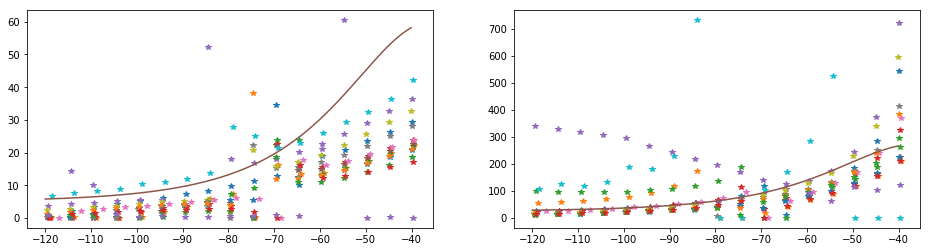

In [46]:
plt.figure(figsize=(16,4))

for tauf, taus, V in zip(taufits_fs_f, taufits_fs_s, tailV):
    plt.subplot(1,2,1)
    plt.plot(V, tauf, '*')
    
    plt.subplot(1,2,2)
    plt.plot(V, taus, '*')

Vprobe = np.arange(-120,-40,0.1)
tauprobe = tau_guess(Vprobe)

plt.subplot(1,2,1)
plt.plot(Vprobe, tauprobe[0])

plt.subplot(1,2,2)
plt.plot(Vprobe, tauprobe[1]);

If I trust this fit, both taus seem to be modelled somewhat too high.

What happens if we fit both taus together with a scaling factor?

0.29974224315450565


/usr/lib/python2.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: overflow encountered in power
/usr/lib/python2.7/site-packages/ipykernel_launcher.py:14: RuntimeWarning: overflow encountered in exp
  


0.05051166049381149
0.06360721307492735
0.06365147248345121
0.11419742416301615
0.048340583974036615
0.2810641955827908
0.18727926438714138
0.1529938176789071
0.06944520043799368
0.0809027239361545
0.10607067240100188
0.3224862178076359
0.6972938078736081
0.04082633741464134

0.17189418899090822


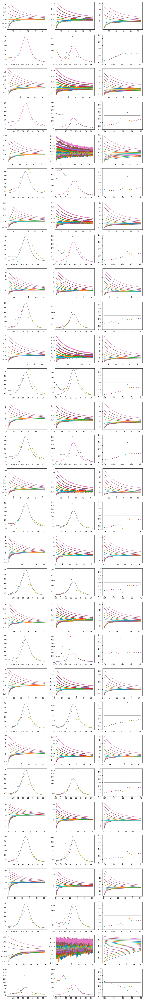

In [47]:
plt.figure(figsize=(16,8*len(ana)))

taufits_fsk_f = [[0 for x in range(len(ana[0].rec2.current))] for y in range(len(ana))]
taufits_fsk_s = [[0 for x in range(len(ana[0].rec2.current))] for y in range(len(ana))]
taufits_fsk_k = [[0 for x in range(len(ana[0].rec2.current))] for y in range(len(ana))]

mean_cost = 0.
for j,a in enumerate(ana):
    t0 = a.rec2.tail_cut
    t = np.arange(t0 - Kv21.rec2_limits[0], t0+dur - Kv21.rec2_limits[0]) * Kv21.tres
    sum_cost = 0.
    
    for i, current, voltage, tail_baseline in zip(range(len(a.rec2.current)),
                                                  a.rec2.current,
                                                  a.rec2.voltage,
                                                  a.rec2.tail_baseline):
        state_after_prepulse = state_at(Kv21.tres*(Kv21.rec2_limits[0]-Kv21.rec2_prepulse),
                                        np.median(voltage[Kv21.rec2_prepulse:Kv21.rec2_limits[0]]),
                                        (0,0,1))
        
        medV = tailV[j][i]
        model_current = HH_state0(t, medV, a.params, state_after_prepulse)
        exp_current = current[t0:t0+dur] - tail_baseline
        
        fit = scipy.optimize.least_squares(lambda p, x, y:
                   HH_state0_tau(x, medV, a.params, state_after_prepulse, p)*p[2] - y,
                                           [tau_guess(medV)[0], tau_guess(medV)[1], 1],
                                           args = (t, exp_current))
        sum_cost += fit.cost

        plt.subplot(2*len(ana),3,6*j+1)
        plt.plot(t, model_current)

        plt.subplot(2*len(ana),3,6*j+2)
        plt.plot(t, exp_current)
        
        plt.subplot(2*len(ana),3,6*j+3)
        plt.plot(t, HH_state0_tau(t, medV, a.params, state_after_prepulse, fit.x)*fit.x[2])
    
        plt.subplot(2*len(ana),3,6*j+4)
        if fit.x[0] < 500:
            plt.plot(medV, fit.x[0], '*')
            taufits_fsk_f[j][i] = fit.x[0]
    
        plt.subplot(2*len(ana),3,6*j+5)
        if fit.x[1] < 1000:
            plt.plot(medV, fit.x[1], '*')
            taufits_fsk_s[j][i] = fit.x[1]
        
        plt.subplot(2*len(ana),3,6*j+6)
        plt.plot(medV, fit.x[2], '*')
        
        taufits_fsk_k[j][i] = fit.x[2]
    
    Vprobe = np.arange(-120, 60, 0.1)
    tauprobe = tau_guess(Vprobe)
    
    ret, V_ = zip(*allfits[j])
    params = [r.x for r in ret]
    V_ += a.params['E_K']
    tn_ = [(el[1] if el[1] < 2500 else 2600) * Kv21.tres for el in params]
    ts_ = [(el[3] if el[3] < 1e4 else 1.1e4) * Kv21.tres for el in params]
    
    plt.subplot(2*len(ana),3,6*j+4)
    plt.plot(Vprobe, tauprobe[0])
    plt.plot(V_, tn_, '*')

    plt.subplot(2*len(ana),3,6*j+5)
    plt.plot(Vprobe, tauprobe[1])
    plt.plot(V_, ts_, '*')
    
    plt.subplot(2*len(ana),3,6*j+6)
    plt.plot([-120,-40], [1,1])
    plt.ylim(0,2)
    
    cost = sum_cost/len(a.rec2.current)
    mean_cost += cost
    print cost
print
print mean_cost/len(ana)

I honestly don't know what to do with this.

/usr/lib/python2.7/site-packages/ipykernel_launcher.py:14: RuntimeWarning: divide by zero encountered in divide
  


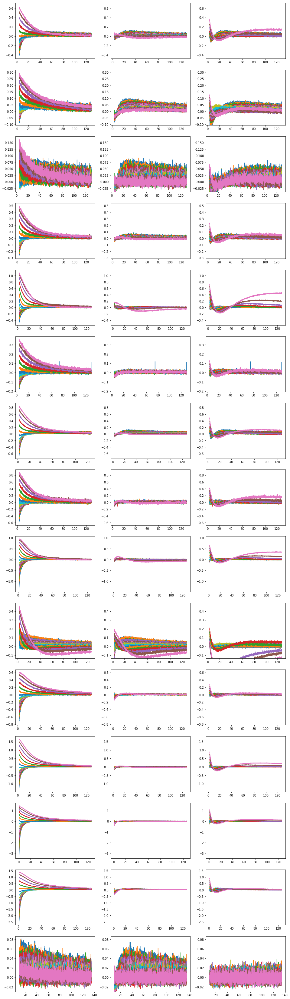

In [48]:
plt.figure(figsize=(16,4*len(ana)))
dur = 5000

for j,a in enumerate(ana):
    t0 = a.rec2.tail_cut
    t = np.arange(t0 - Kv21.rec2_limits[0], t0+dur - Kv21.rec2_limits[0]) * Kv21.tres
    
    for i, current, voltage, tail_baseline in zip(range(len(a.rec2.current)),
                                                  a.rec2.current,
                                                  a.rec2.voltage,
                                                  a.rec2.tail_baseline):
        state_after_prepulse = state_at(Kv21.tres*(Kv21.rec2_limits[0]-Kv21.rec2_prepulse),
                                        np.median(voltage[Kv21.rec2_prepulse:Kv21.rec2_limits[0]]),
                                        (0,0,1))
        
        medV = tailV[j][i]
        tau_model_current = HH_state0_tau(t, medV, a.params, state_after_prepulse, (taufits_fs_f[j][i], taufits_fs_s[j][i]))
        model_current = HH_state0(t, medV, a.params, state_after_prepulse)
        exp_current = current[t0:t0+dur] - tail_baseline
        
        plt.subplot(len(ana), 3, 3*j+1)
        plt.plot(t, model_current - exp_current)
        lim = plt.ylim()
        
        plt.subplot(len(ana), 3, 3*j+2)
        plt.plot(t, model_current*kfits[j][i] - exp_current)
        plt.ylim(lim)
        
        plt.subplot(len(ana), 3, 3*j+3)
        plt.plot(t, tau_model_current - exp_current)
        plt.ylim(lim)

Residual currents. Left: Residual from the fully parametric model. Centre: Residual from individually scaled parametric model traces (fit k). Right: Residual from model traces using nonparametric deactivation $\tau$.
The fitting cost for the k-fits is only little less than that for the $\tau$ fits, but the goodness of fit is really striking. Unfortunately, there seems to be no candidate Hodgkin-Huxley mechanism to exploit the apparent regularity in the k both within and between recordings.

3.4309061573065716
2.6664467766106372
1.6654376464190843
0.9830418475464426
0.45225044489128396
0.1861844974779821
4.623827388692177
0.5855018396850018
0.5836703161315325
2.9074876031493626
0.22908847299749363
0.35402149946599715
0.9808540942107317
3.4474709994870345
0.825006400557467

1.594746398975253


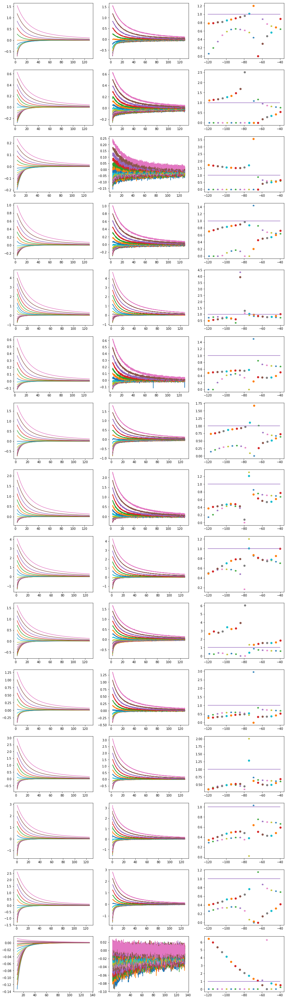

In [49]:
plt.figure(figsize=(16,4*len(ana)))
dur = 5000

def HH_state0_g(t, V, params, state0, g):
    state = state_at(t, V, state0)
    return (V - params['E_K']) * (params['gK_fast']*g[0] * state[0]**4 * state[2] + params['gK_slow']*g[1] * state[1]**4)

# kfits = [[0 for x in range(len(ana[0].rec2.current))] for y in range(len(ana))]

mean_cost = 0.
for j,a in enumerate(ana):
    t0 = a.rec2.tail_cut
    t = np.arange(t0 - Kv21.rec2_limits[0], t0+dur - Kv21.rec2_limits[0]) * Kv21.tres
    sum_cost = 0.
    
    for i, current, voltage, tail_baseline in zip(range(len(a.rec2.current)),
                                                  a.rec2.current,
                                                  a.rec2.voltage,
                                                  a.rec2.tail_baseline):
        state_after_prepulse = state_at(Kv21.tres*(Kv21.rec2_limits[0]-Kv21.rec2_prepulse),
                                        np.median(voltage[Kv21.rec2_prepulse:Kv21.rec2_limits[0]]),
                                        (0,0,1))
        
        medV = tailV[j][i]
        exp_current = current[t0:t0+dur] - tail_baseline
        
        fit = scipy.optimize.least_squares(lambda g: HH_state0_g(t,medV,a.params,state_after_prepulse,g) - exp_current,
                                           [1,1],
                                           bounds = ([0.,0.],[np.inf,np.inf]))
        sum_cost += fit.cost
        
#         kfits[j][i] = fit.x[0]

        plt.subplot(len(ana),3,3*j+1)
        plt.plot(t, HH_state0_g(t,medV,a.params,state_after_prepulse,fit.x))

        plt.subplot(len(ana),3,3*j+2)
        plt.plot(t, exp_current)
        
        plt.subplot(len(ana),3,3*j+3)
        plt.plot(medV, fit.x[0], '*')
        plt.plot(medV, fit.x[1], 'o')
        
    plt.plot([-120,-40], [1,1])
    
    cost = sum_cost/len(a.rec2.current)
    mean_cost += cost
    print cost
print
print mean_cost/len(ana)

Adjusting the fast (asterisks) and slow (circles) component $g$ individually does not reveal any obvious culprits, either.

3.55568493065843
1.795791172915935
0.7972334159982465
1.0763521906482256
0.29791042067758117
0.22016934059828627
4.770976055024678
0.6611973229278607
0.49943190472567667
0.49942384487428626
0.2920307841245517
0.41989106205766213
1.4170551069844592
4.549222331653644
0.11815233345022186

1.398034814487983


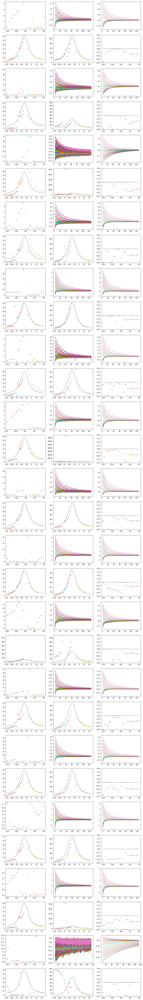

In [51]:
plt.figure(figsize=(16,8*len(ana)))
dur = 5000

fxfits_tn = [[0 for x in range(len(ana[0].rec2.current))] for y in range(len(ana))]
fxfits_ts = [[0 for x in range(len(ana[0].rec2.current))] for y in range(len(ana))]
fxfits_tm = [[0 for x in range(len(ana[0].rec2.current))] for y in range(len(ana))]
fxfits_k = [[0 for x in range(len(ana[0].rec2.current))] for y in range(len(ana))]

def tau_guess_fx(V):
    taun = tau_model(taun_p0, V)
    taus = tau_model(taus_p0, V)
    taum = 0.1 * taun
    return (taun, taus, taum)
    
def state_fixedtau_fx(t, V, state, tau):
    ninf = sigmoid(fit_n.x, V)
    n = ninf - (ninf-state[0]) * np.exp(-t/tau[0])

    sinf = sigmoid(fit_s.x, V)
    s = sinf - (sinf-state[1]) * np.exp(-t/tau[1])
    
    m = ninf - (ninf - state[0]) * np.exp(-t/tau[2])

    hinf = sigmoid(fit_h.x, V)
    tauh = taui_asymmetric(tauia_p, V)
    h = hinf - (hinf-state[2]) * np.exp(-t/tauh)
    
    return (n, s, h, m)

def HH_state0_tau_fx(t, V, params, state0, p):
    state = state_fixedtau_fx(t, V, state0, p)
    return (V - params['E_K']) * (p[3] * params['gK_fast'] * state[0]**4 * state[2] \
                                  + params['gK_slow'] * state[1]**4 \
                                  + (1-p[3]) * params['gK_fast'] * state[3]**4 * state[2])

mean_cost = 0.
for j,a in enumerate(ana):
    t0 = a.rec2.tail_cut
    t = np.arange(t0 - Kv21.rec2_limits[0], t0+dur - Kv21.rec2_limits[0]) * Kv21.tres
    sum_cost = 0.
    
    for i, current, voltage, tail_baseline in zip(range(len(a.rec2.current)),
                                                  a.rec2.current,
                                                  a.rec2.voltage,
                                                  a.rec2.tail_baseline):
        state_after_prepulse = state_at(Kv21.tres*(Kv21.rec2_limits[0]-Kv21.rec2_prepulse),
                                        np.median(voltage[Kv21.rec2_prepulse:Kv21.rec2_limits[0]]),
                                        (0,0,1))
        
        medV = tailV[j][i]
        model_current = HH_state0(t, medV, a.params, state_after_prepulse)
        exp_current = current[t0:t0+dur] - tail_baseline
        
        fit = scipy.optimize.least_squares(lambda p, x, y:
                   HH_state0_tau_fx(x, medV, a.params, state_after_prepulse, p) - y,
                                           list(tau_guess_fx(medV)) + [0.9],
                                           bounds = ([0,0,0,0], [np.inf,np.inf,50,1]),
                                           args = (t, exp_current))
        sum_cost += fit.cost

        plt.subplot(2*len(ana),3,6*j+1)
        plt.plot(medV, fit.x[2], '*')

        plt.subplot(2*len(ana),3,6*j+2)
        plt.plot(t, exp_current)
        
        plt.subplot(2*len(ana),3,6*j+3)
        plt.plot(t, HH_state0_tau_fx(t, medV, a.params, state_after_prepulse, fit.x))
    
        plt.subplot(2*len(ana),3,6*j+4)
        plt.plot(medV, fit.x[0], '*')
        fxfits_tn[j][i] = fit.x[0]
    
        plt.subplot(2*len(ana),3,6*j+5)
        plt.plot(medV, fit.x[1], '*')
        fxfits_ts[j][i] = fit.x[1]
        
        plt.subplot(2*len(ana),3,6*j+6)
        plt.plot(medV, fit.x[3], '*')
        
        fxfits_tm[j][i] = fit.x[2]
        fxfits_k[j][i] = fit.x[3]
    
    Vprobe = np.arange(-120, 60, 0.1)
    tauprobe = tau_guess(Vprobe)
    
    ret, V_ = zip(*allfits[j])
    params = [r.x for r in ret]
    V_ += a.params['E_K']
    tn_ = [(el[1] if el[1] < 2500 else 2600) * Kv21.tres for el in params]
    ts_ = [(el[3] if el[3] < 1e4 else 1.1e4) * Kv21.tres for el in params]
    
    plt.subplot(2*len(ana),3,6*j+4)
    plt.plot(Vprobe, tauprobe[0])
    plt.plot(V_, tn_, '*')

    plt.subplot(2*len(ana),3,6*j+5)
    plt.plot(Vprobe, tauprobe[1])
    plt.plot(V_, ts_, '*')
    
    plt.subplot(2*len(ana),3,6*j+6)
    plt.plot([-120,-40], [1,1])
    plt.ylim(0,2)
    
    cost = sum_cost/len(a.rec2.current)
    mean_cost += cost
    print cost
print
print mean_cost/len(ana)